# Naural network hidden layers activation embeding

#### In this notebook we will use fully connected neural network for a classification task to improve visualizations algorithm from previous classes.

In the fully connected neural network, the output of each layer is computed using the activations from the previous one. In neural network training process, each successive layer learns to extract features from data with increasingly higher levels of abstraction. In this exercise, instead of directly visualizing data, we'll try to visualize the activation of hidden layers in neural networks. Using this idea, we can improve the process of data visualization, and on the other hand, see how processing this data looks like by a neural network.

In the first stage, we define simple architecture of the neural network and train it to recognize digits in the MNIST dataset

In [1]:
import keras.models
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation
from keras.models import Sequential, Model
from keras.layers import Dense, Dropout
from keras.optimizers import SGD
import keras.backend as K

from keras.datasets import mnist
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split


%matplotlib inline
plt.rcParams["animation.html"] = "jshtml"

In [3]:
nb_classes = 10

The dropout layers have the very specific function to drop out a random set of activations in that layers by setting them to zero in the forward pass. Simple as that.
It allows to avoid overfitting but has to be used only at training time and not at test time.

In [24]:
# set dropout rate - fractions of neurons to drop

dropout = 0.5

In [25]:
# build very simple neural network with 2 hidden layers

model = Sequential()
model.add(Dense(256, activation='relu', input_shape=(784,)))
model.add(Dropout(dropout))
model.add(Dense(64, activation='relu'))
model.add(Dropout(dropout))
model.add(Dense(nb_classes, activation='softmax'))

model.compile(loss='categorical_crossentropy', optimizer='adam', 
              metrics=['accuracy'])

In [5]:
# The binary_crossentropy loss expects a one-hot-vector as input,
# so we apply the to_categorical function from keras.utilis to convert integer labels to one-hot-vectors.
(X_train, y_train), (X_test, y_test) = mnist.load_data()

In [6]:
X_train.shape

(60000, 28, 28)

In [7]:
X_train = X_train.reshape(60000, 784)
X_test = X_test.reshape(10000, 784)
X_train = X_train.astype("float32")
X_test = X_test.astype("float32")

# Put everything on grayscale
X_train /= 255
X_test /= 255

# convert class vectors to binary class matrices
Y_train = to_categorical(y_train, 10)
Y_test = to_categorical(y_test, 10)


In [8]:
# split training and validation data
X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, train_size=5/6)

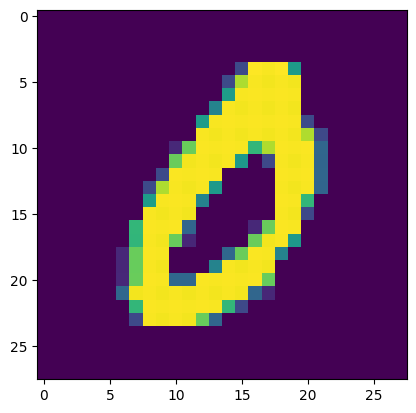

In [9]:
# show example digit
plt.imshow(X_train[0].reshape(28, 28))

In [10]:
# When we have defined and compiled the model, it can be trained using the fit function.
# We also use validation dataset to monitor validation loss and accuracy.

network_history = model.fit(X_train, Y_train, batch_size=128, 
                            epochs=20, verbose=1, validation_data=(X_val, Y_val))

Epoch 1/20
391/391 ━━━━━━━━━━━━━━━━━━━━ 13s 17ms/step - accuracy: 0.6434 - loss: 1.0847 - val_accuracy: 0.9435 - val_loss: 0.2059
Epoch 2/20
391/391 ━━━━━━━━━━━━━━━━━━━━ 9s 12ms/step - accuracy: 0.9060 - loss: 0.3266 - val_accuracy: 0.9551 - val_loss: 0.1592
Epoch 3/20
391/391 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - accuracy: 0.9306 - loss: 0.2490 - val_accuracy: 0.9628 - val_loss: 0.1296
Epoch 4/20
391/391 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - accuracy: 0.9415 - loss: 0.2070 - val_accuracy: 0.9657 - val_loss: 0.1194
Epoch 5/20
391/391 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - accuracy: 0.9472 - loss: 0.1843 - val_accuracy: 0.9705 - val_loss: 0.1100
Epoch 6/20
391/391 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.9523 - loss: 0.1651 - val_accuracy: 0.9709 - val_loss: 0.1033
Epoch 7/20
391/391 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.9560 - loss: 0.1522 - val_accuracy: 0.9728 - val_loss: 0.0988
Epoch 8/20
391/391 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.9601 - loss: 0.1410 - val_acc

In [11]:
def plot_history(network_history):
    plt.figure()
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.plot(network_history.history['loss'])
    plt.plot(network_history.history['val_loss'])
    plt.legend(['Training', 'Validation'])

    plt.figure()
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.plot(network_history.history['accuracy'])
    plt.plot(network_history.history['val_accuracy'])
    plt.legend(['Training', 'Validation'], loc='lower right')
    plt.show()

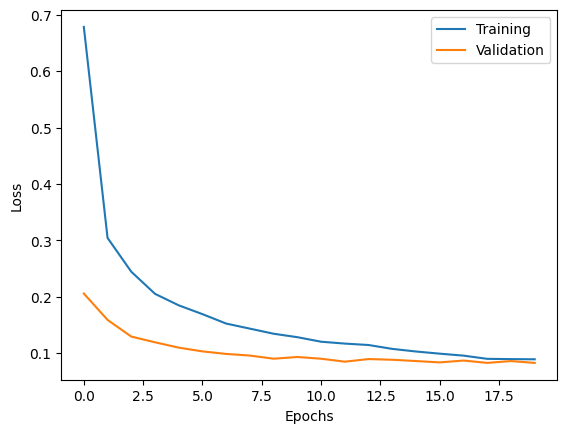

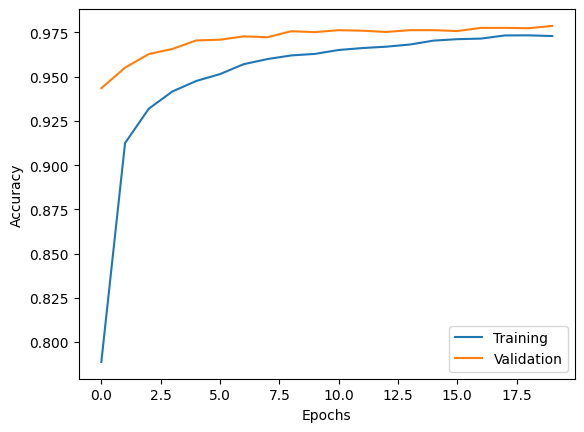

In [12]:
# fit function return keras.callbacks.History object which contains the entire history
# of training/validation loss, accuracy and other metrices for each epoch.
# We can therefore plot the behaviour of loss and accuracy during the training phase.

plot_history(network_history)

In [13]:
# Keras Model have summary function, that print data about model architecture
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 256)            │       200,960 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │        16,448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 10)             │           650 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 654,176 (2.50 MB)

 Trainable params: 218,058 (851.79 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 436,118 (1.66 MB)

In [26]:
# We are interested in downloading the activation of hidden layers, because the dropout layers are between them,
# we need to properly select the index of the three dense layers.
new_model = Model(inputs=model.inputs, 
                  outputs=[model.layers[0].output, model.layers[2].output, model.layers[4].output])

# Używanie nowego modelu do uzyskania aktywacji z wybranych warstw dla danych wejściowych
layer1_output, layer2_output, layer3_output = new_model.predict(X_train)

1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step


In [27]:
train_ids = [np.arange(len(Y_train))[Y_train[:,i] == 1] for i in range(10)]

The 2 graphs below are not directly related to the topic of the exercise, but they visualize very well how neuron activation actives work and for explanation are included.

In [16]:
%%capture
%matplotlib inline

# this animation shows what the example number 5 looks like
# and what activations of neurons look in hidden layers of the neural network



# digit to be plotted
digit = 5

# indices of frames to be plotted for this digit
n = range(50)

# initialize plots
f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(15,4))

# prepare plots
ax1.set_title('Input Layer', fontsize=16)
ax1.axes.get_xaxis().set_visible(False)
ax1.axes.get_yaxis().set_visible(False)

ax2.set_title('Hidden Layer 1', fontsize=16)
ax2.axes.get_xaxis().set_visible(False)
ax2.axes.get_yaxis().set_visible(False)

ax3.set_title('Hidden Layer 2', fontsize=16)
ax3.axes.get_xaxis().set_visible(False)
ax3.axes.get_yaxis().set_visible(False)
    
ax4.set_title('Output Layer', fontsize=16)
ax4.axes.get_xaxis().set_visible(False)
ax4.axes.get_yaxis().set_visible(False)   

# add numbers to the output layer plot to indicate label
for i in range(3):
    for j in range(4):
        text = ax4.text(j, i, [[0, 1, 2, 3], [4, 5, 6, 7], [8, 9, '', '']][i][j],
                        ha="center", va="center", color="w", fontsize=16)    
        
def animate(id):
    # plot elements that are changed in the animation
    digit_plot = ax1.imshow(X_train[train_ids[digit][id]].reshape((28,28)), animated=True)
    layer1_plot = ax2.imshow(layer1_output[train_ids[digit][id]].reshape((16,16)), animated=True)
    layer2_plot = ax3.imshow(layer2_output[train_ids[digit][id]].reshape((8,8)), animated=True)
    output_plot = ax4.imshow(np.append(layer3_output[train_ids[digit][id]], 
                                       [np.nan, np.nan]).reshape((3,4)), animated=True)
    return digit_plot, layer1_plot, layer2_plot, output_plot,

# define animation
ani = matplotlib.animation.FuncAnimation(f, animate, frames=n, interval=100)

In [17]:
ani

In most cases the same subset of neurons fires, while other neurons remain quiescent. This is much more obvious in the second hidden layer than in the first hidden layer and can be interpreted as the first layer pre-processesing the pixel data, while the second layer deals with pattern recognition.

This effect is mainly caused by regularization forced by dropout. Dropout generally leads to the sparse weight matrices where a significant part of connection weights are close to 0. Insignificant weights are suppressed.


Optional, nonobligatory task:
You can easily see how the visualizations change if you comment lines responsible for the dropout "model.add(Dropout(dropout))".
Remember to change "get_layer_output", because after removing the dropout, the dense layers will have indexes: 0,1,2.


In [18]:
%%capture
%matplotlib inline


# Let's check the similarity in behavior for frames showing the same digit by looking at the ensemble properties.
# In this case, ensemble properties refers to how the neurons behave on average
# for a large number of frames showing the same digit.

# digit to be plotted
digit = 6

# numbers of frames to be summed over
n = np.append([1], np.linspace(5, 100, 20, dtype=int))

# initialize plots
f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(15,4))

# add a counter indicating the number of frames used in the summation
counter = ax1.text(1, 2, 'n={}'.format(0), color='white', fontsize=16, animated=True)

# prepare plots
ax1.set_title('Input Layer', fontsize=16)
ax1.axes.get_xaxis().set_visible(False)
ax1.axes.get_yaxis().set_visible(False)

ax2.set_title('Hidden Layer 1', fontsize=16)
ax2.axes.get_xaxis().set_visible(False)
ax2.axes.get_yaxis().set_visible(False)

ax3.set_title('Hidden Layer 2', fontsize=16)
ax3.axes.get_xaxis().set_visible(False)
ax3.axes.get_yaxis().set_visible(False)
    
ax4.set_title('Output Layer', fontsize=16)
ax4.axes.get_xaxis().set_visible(False)
ax4.axes.get_yaxis().set_visible(False)   

# add numbers to the output layer plot to indicate label
for i in range(3):
    for j in range(4):
        text = ax4.text(j, i, [[0, 1, 2, 3], [4, 5, 6, 7], [8, 9, '', '']][i][j],
                        ha="center", va="center", color="w", fontsize=16)    
        
def animate(id):
    # plot elements that are changed in the animation
    digit_plot = ax1.imshow(np.sum(X_train[train_ids[digit][:id]], axis=0).reshape((28,28)), animated=True)
    layer1_plot = ax2.imshow(np.sum(layer1_output[train_ids[digit][:id]], axis=0).reshape((16,16)), animated=True)
    layer2_plot = ax3.imshow(np.sum(layer2_output[train_ids[digit][:id]], axis=0).reshape((8,8)), animated=True)
    output_plot = ax4.imshow(np.append(np.sum(layer3_output[train_ids[digit][:id]], axis=0), 
                                       [np.nan, np.nan]).reshape((3,4)), animated=True)
    counter.set_text('n={}'.format(id))
    return digit_plot, layer1_plot, layer2_plot, output_plot, counter,

# define animation
ani = matplotlib.animation.FuncAnimation(f, animate, frames=n, interval=100)

In [19]:
ani

After summing up the responses of as little as 20-30 frames, the pattern in the second hidden layer is almost static. After combining about 70-80 frames, also the pattern in the first hidden layer appears static. This supports the idea that only a subset of all neurons is involved in the recognition of individual digits.

Especially the above plot is important when we think about use of neural networks for data visualization. We can clearly see that the activation generated by examples belonging to the same class are less chaotic than the examples themselves, therefore their visualization should give a more clustered structure

# Task 1

- Project a MNIST training part into 2-dimensional space using t-SNE, TriMAP, PaCMAP and UMAP.

- Use layer1_output and layer2_output to project first and second hidden layers of neural network into a 2-dimensional space. Also divided into a test and training set, use the same methods as the point above.

- Also visualize the test part.

- Try to use 2-dimensional projection for classification task.

- Use embeddings lerned on raw train data (and also on hidden activations of train data) to transform test data (and also hidden activations of test data) into 2-dimensional space.

- Use the k-nearest neighbors algorithm to classify transformed points from the test set. Use the KNN algorithm in which you will use points from the training set as a neighbor with known class assignment. Because t-SNE is a non-linear, non-parametric embedding you cant use already learned t-SNE to transform new points into the existing embedded space. So for this part, use only UMAP with have fit_transform method (learn manifold) and also transform (only project new data to existing manifold). Try with few values of n_neighbors e.g [3, 5, 10]

- Estimate the accuracy of classification using this approach. Use all 3 layers (raw data, 1 hidden layer, 2 hidden layer) and few values of n_neighbors

- Project a MNIST training part into 2-dimensional space using t-SNE, TriMAP, PaCMAP and UMAP.

In [4]:
from keras.utils import to_categorical
from sklearn.manifold import TSNE

(X_train, y_train), (X_test, y_test) = mnist.load_data()

X_train = X_train.reshape(60000, 784)
X_test = X_test.reshape(10000, 784)
X_train = X_train.astype("float32")
X_test = X_test.astype("float32")

X_train /= 255
X_test /= 255

Y_train = to_categorical(y_train, nb_classes)
Y_test = to_categorical(y_test, nb_classes)

def plot_2d_mnist_scatter(X, y):
    fig, plot = plt.subplots()
    fig.set_size_inches(10, 10)
    plt.prism()
    
    for i in range(10):
        digit_indices = (y == i)
        dim0 = X[digit_indices, 0]
        dim1 = X[digit_indices, 1]
        plot.scatter(dim0, dim1, label=f"Digit {i}")
        
    plot.set_xticks(())
    plot.set_yticks(())
    
    plt.tight_layout()
    plt.legend()
    plt.show()

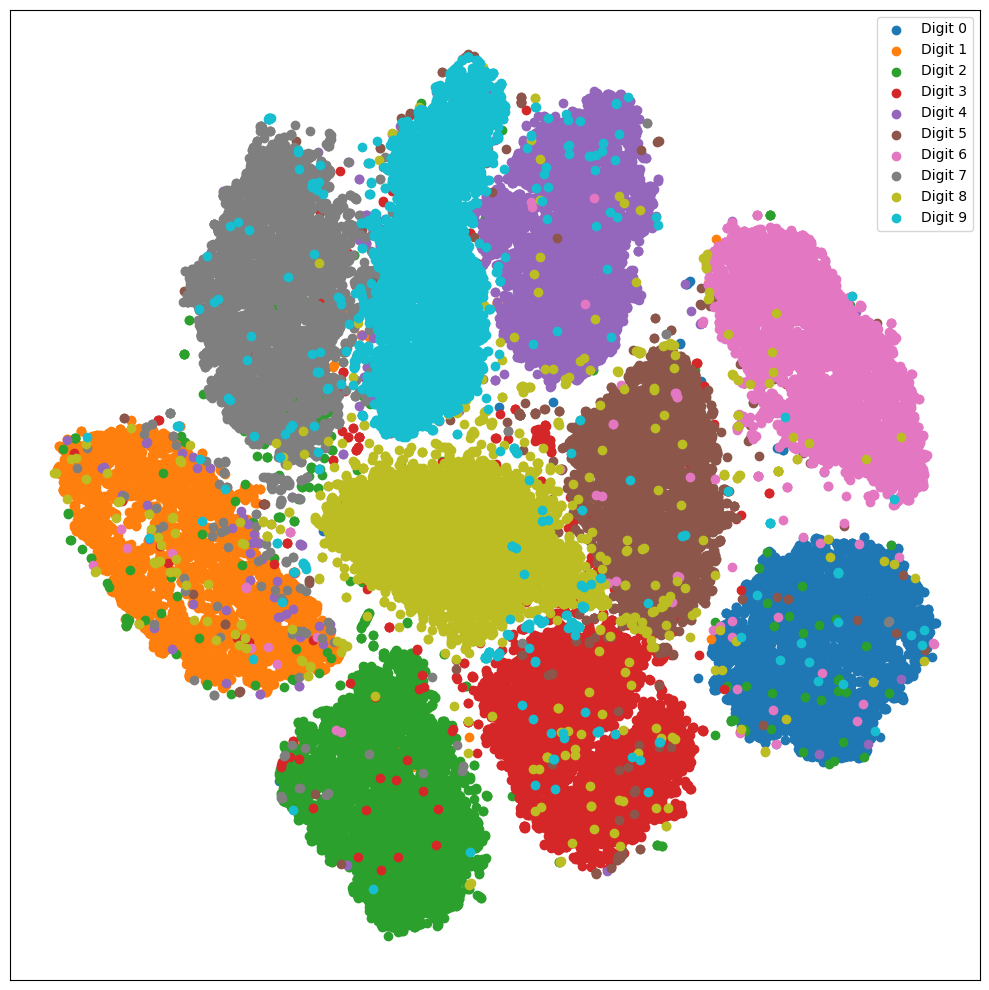

In [47]:
mnist_tsne = TSNE(n_components=2, perplexity=40).fit_transform(X_train)
plot_2d_mnist_scatter(mnist_tsne, y_train)

C:\Users\Acer\AppData\Local\Programs\Python\Python312\Lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


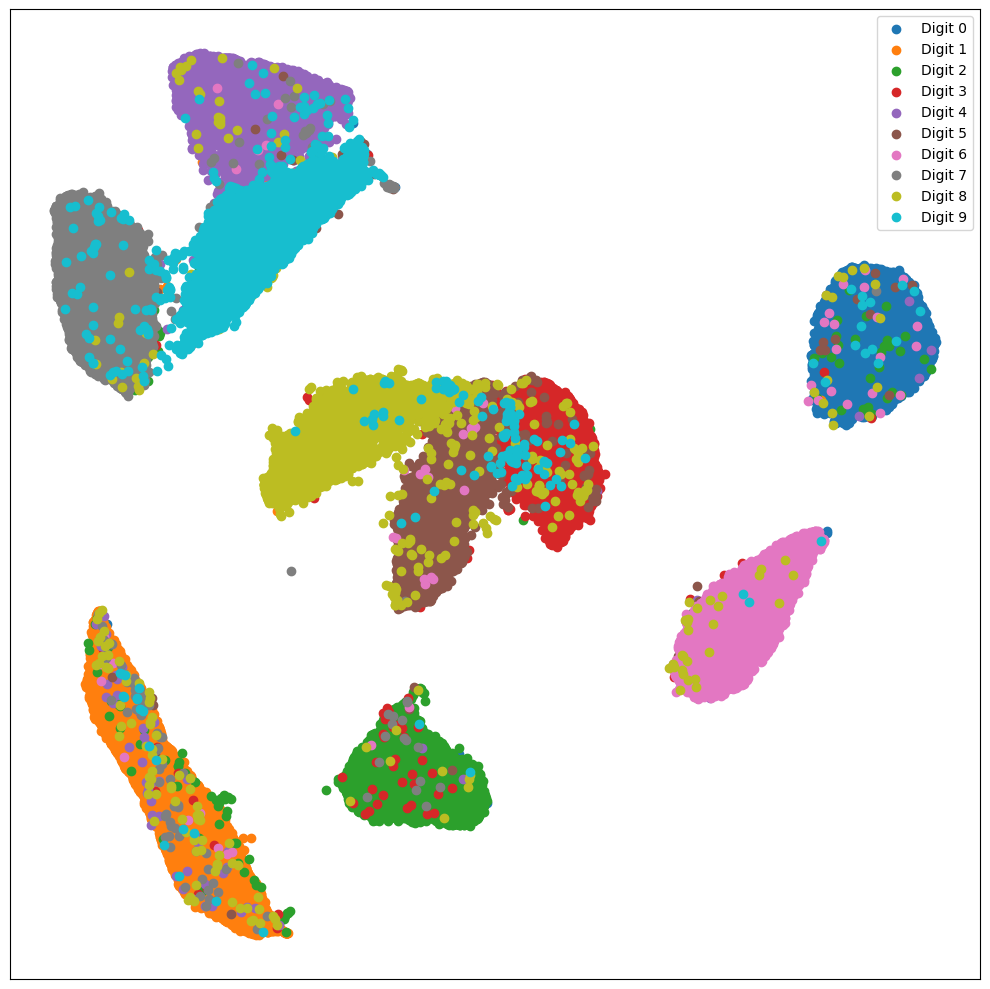

In [6]:
import umap
umap_model = umap.UMAP(n_components=2, random_state=42)
mnist_umap= umap_model.fit_transform(X_train)
plot_2d_mnist_scatter(mnist_umap, y_train)

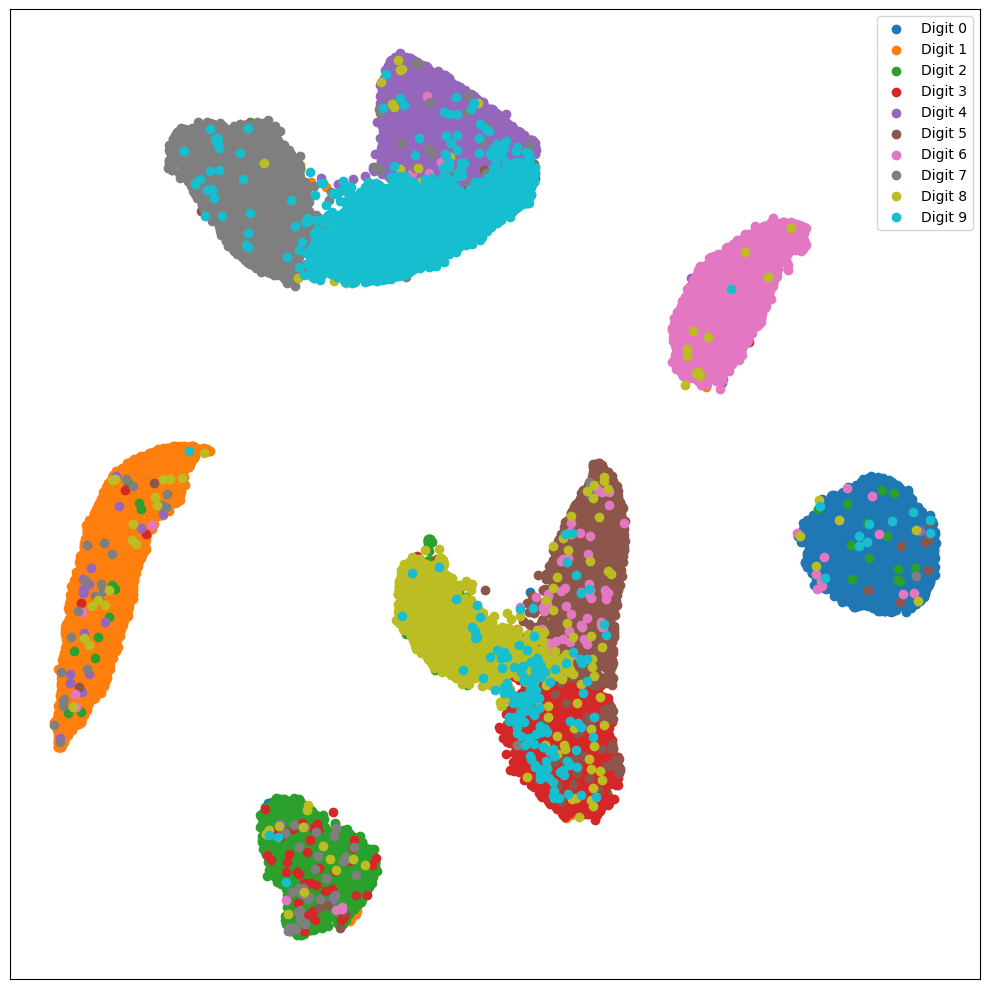

In [13]:
import pacmap
pacmap_inst = pacmap.PaCMAP(n_components=2, n_neighbors=10) 
mnist_pacmap = pacmap_inst.fit_transform(X_train)
plot_2d_mnist_scatter(mnist_pacmap, y_train)

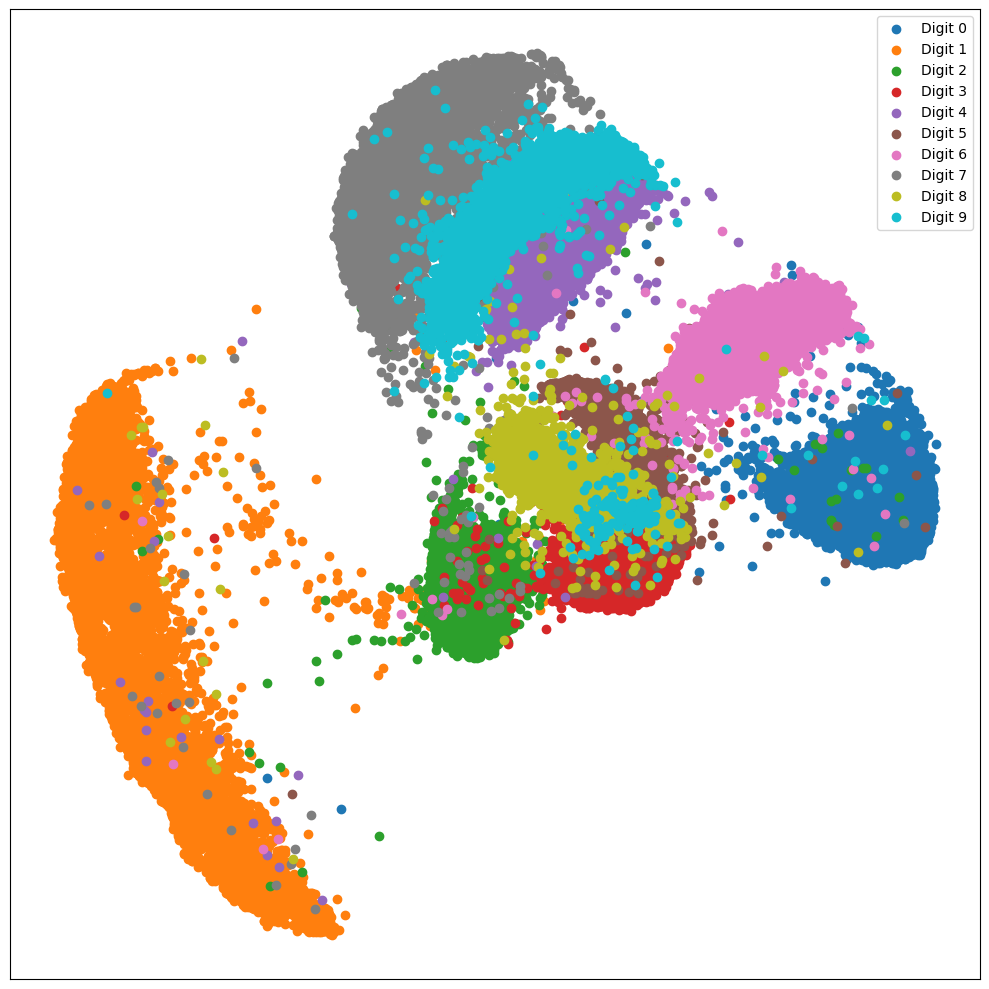

In [15]:
import trimap

trimap_inst = trimap.TRIMAP()
mnist_trimap = trimap_inst.fit_transform(X_train)
plot_2d_mnist_scatter(mnist_trimap, y_train)


- Use layer1_output and layer2_output to project first and second hidden layers of neural network into a 2-dimensional space. Also divided into a test and training set, use the same methods as the point above.
- Also visualize the test part.
- Try to use 2-dimensional projection for classification task.

In [28]:
from keras.models import Model

def get_layer_output(data):
    new_model = Model(inputs=model.inputs, outputs=[model.layers[0].output, model.layers[2].output, model.layers[4].output])

    layer_outputs = new_model.predict(data)
    return layer_outputs

train_layer_outputs = get_layer_output(X_train)  
test_layer_outputs = get_layer_output(X_test)  

train_layer1_output, train_layer2_output, train_layer3_output = train_layer_outputs
test_layer1_output, test_layer2_output, test_layer3_output = test_layer_outputs

1875/1875 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


C:\Users\Acer\AppData\Local\Programs\Python\Python312\Lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


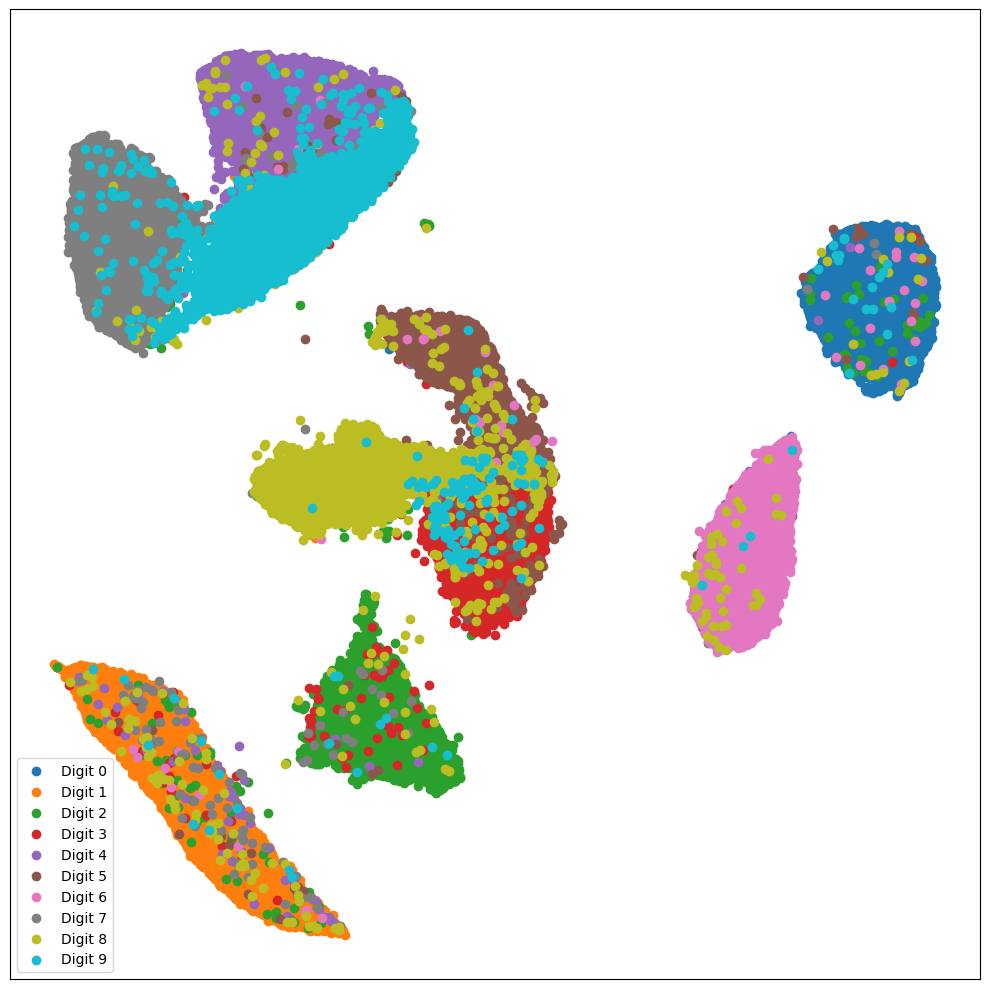

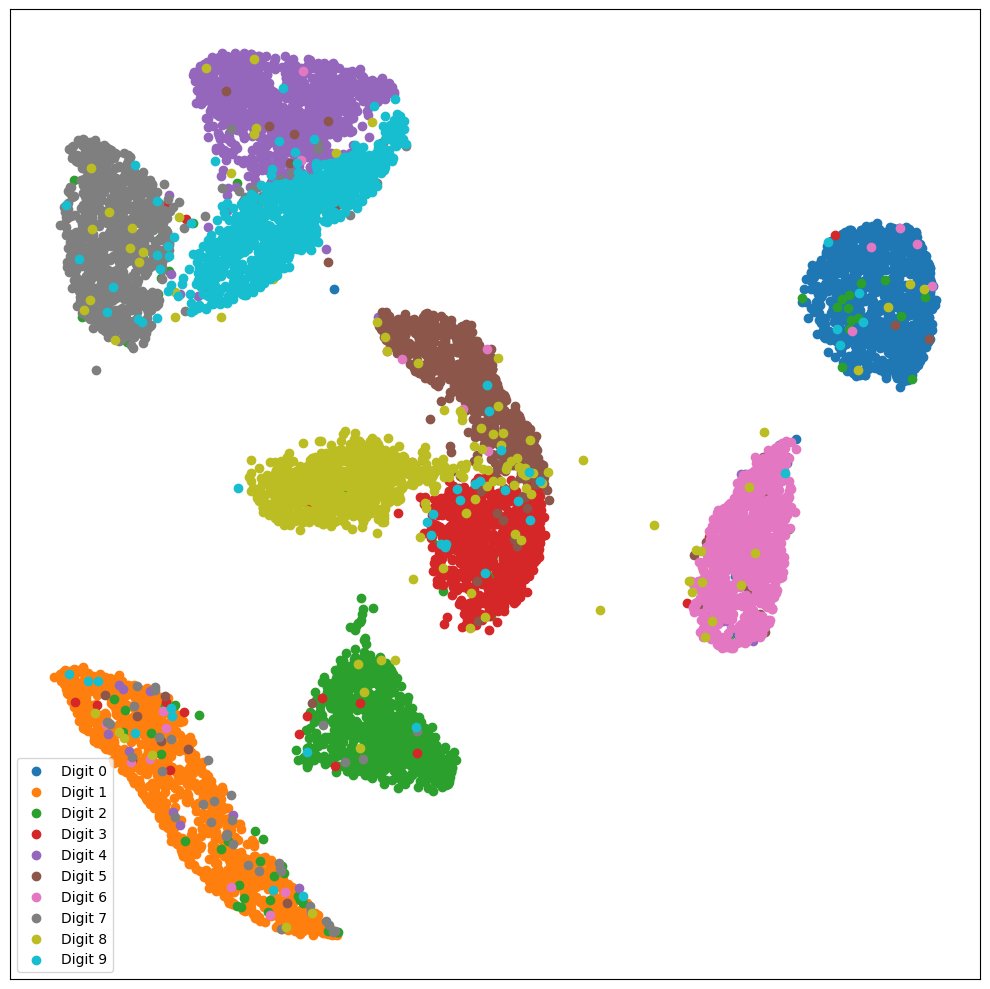

C:\Users\Acer\AppData\Local\Programs\Python\Python312\Lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


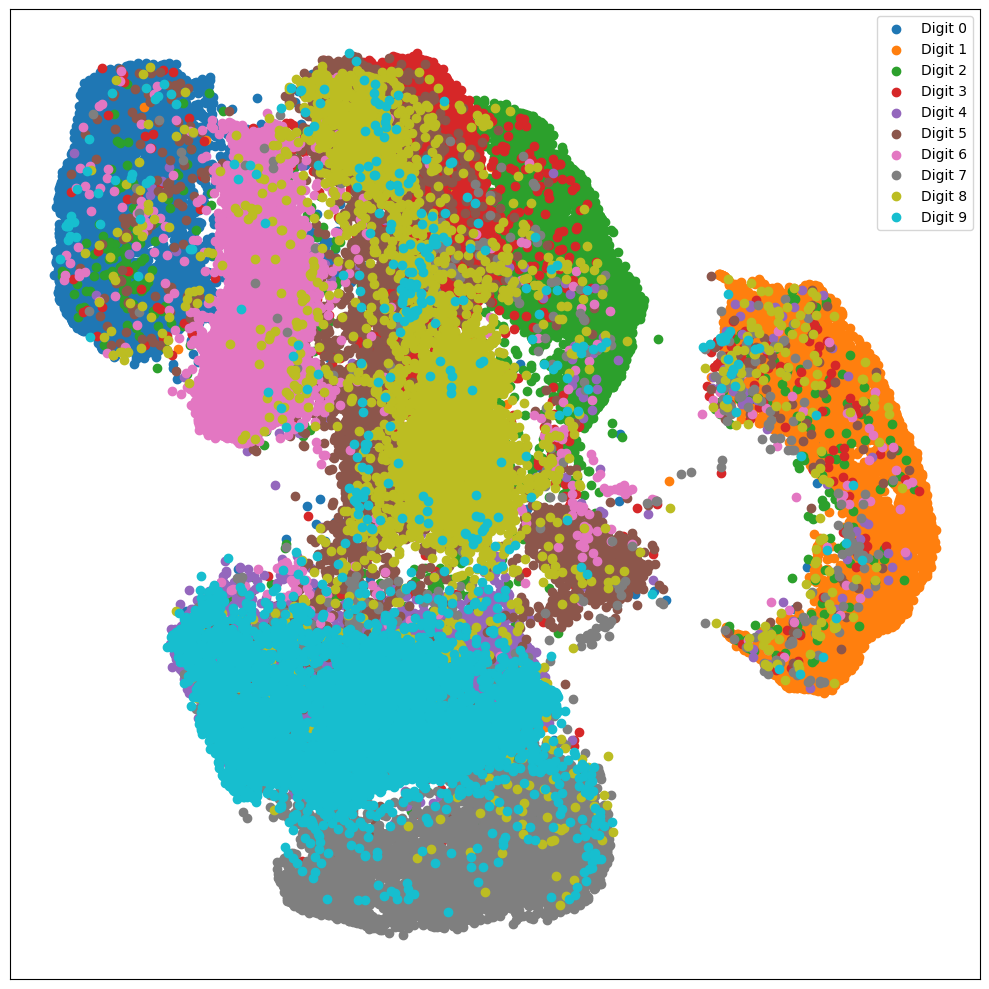

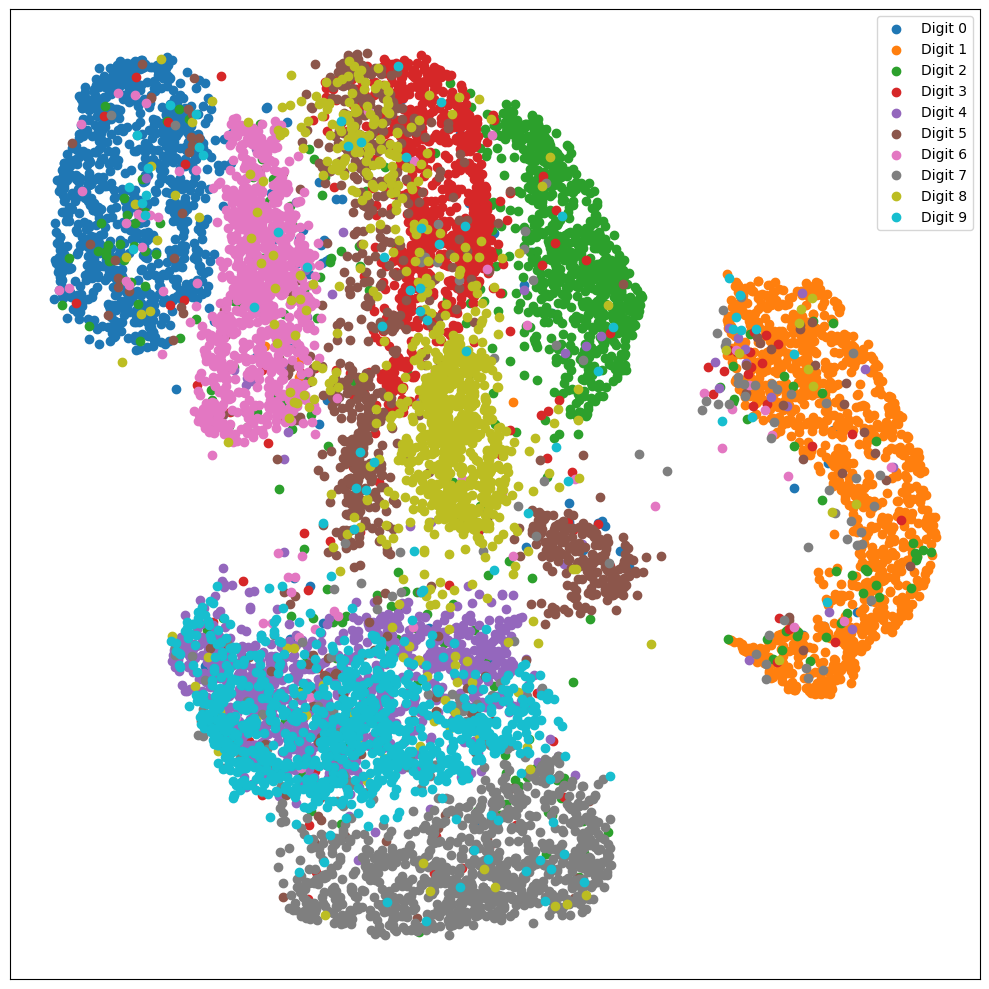

In [29]:
umap_model_layer1 = umap.UMAP(n_components=2, random_state=42)
train_layer1_umap = umap_model_layer1.fit_transform(train_layer1_output)
test_layer1_umap = umap_model_layer1.transform(test_layer1_output)

plot_2d_mnist_scatter(train_layer1_umap, y_train)
plot_2d_mnist_scatter(test_layer1_umap, y_test)

umap_model_layer2 = umap.UMAP(n_components=2, random_state=42)
train_layer2_umap = umap_model_layer2.fit_transform(train_layer2_output)
test_layer2_umap = umap_model_layer2.transform(test_layer2_output)

plot_2d_mnist_scatter(train_layer2_umap, y_train)
plot_2d_mnist_scatter(test_layer2_umap, y_test)


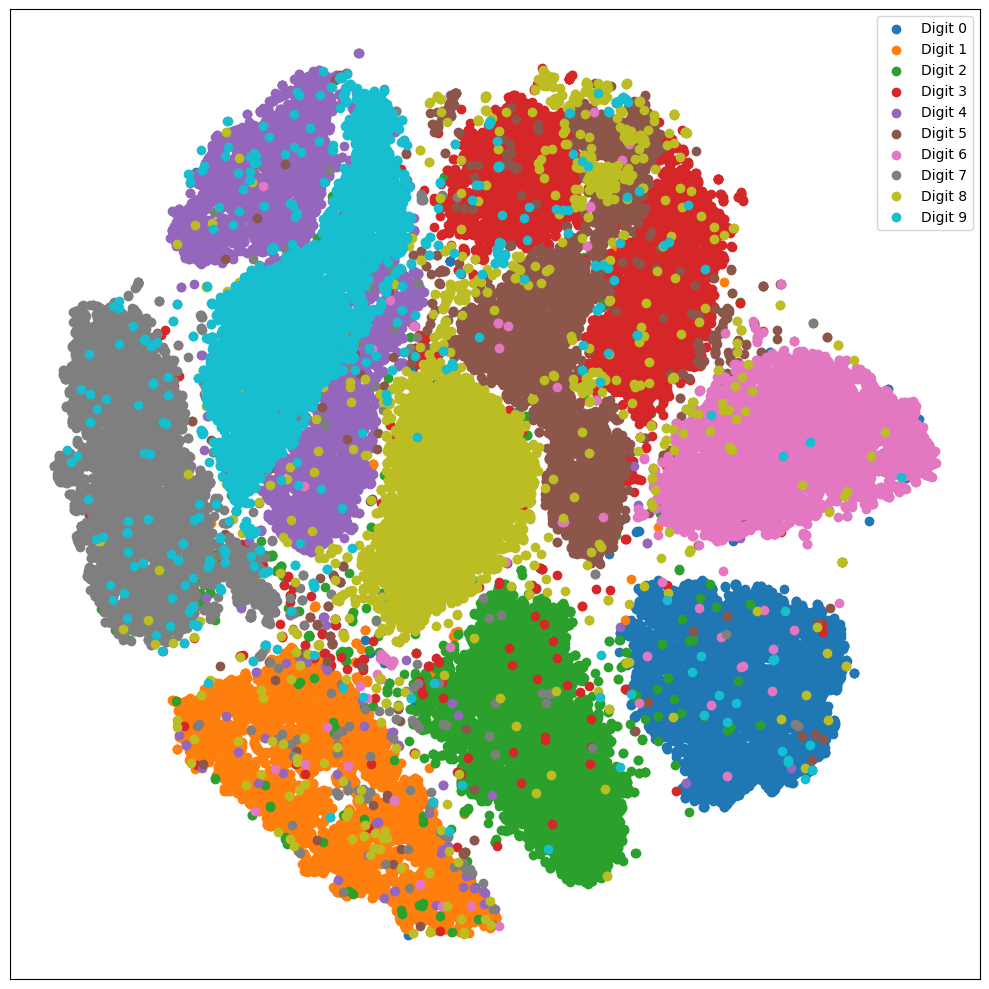

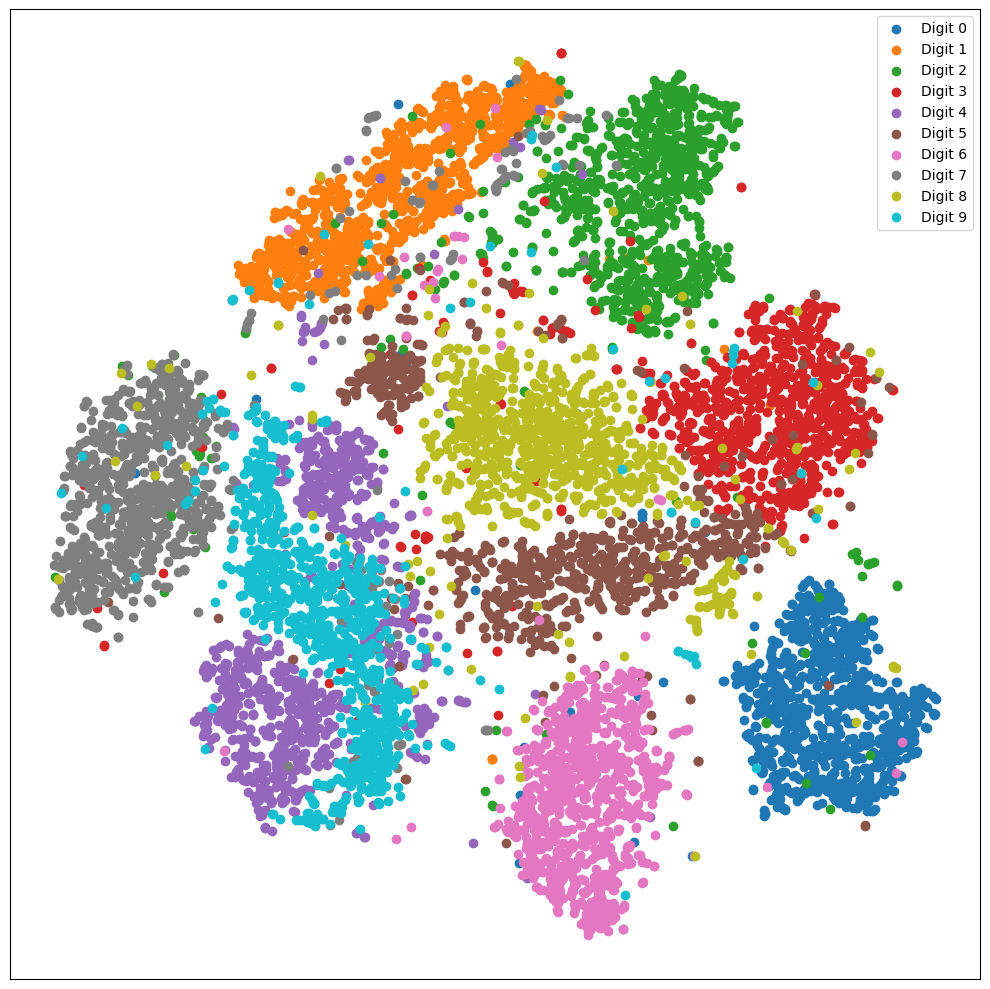

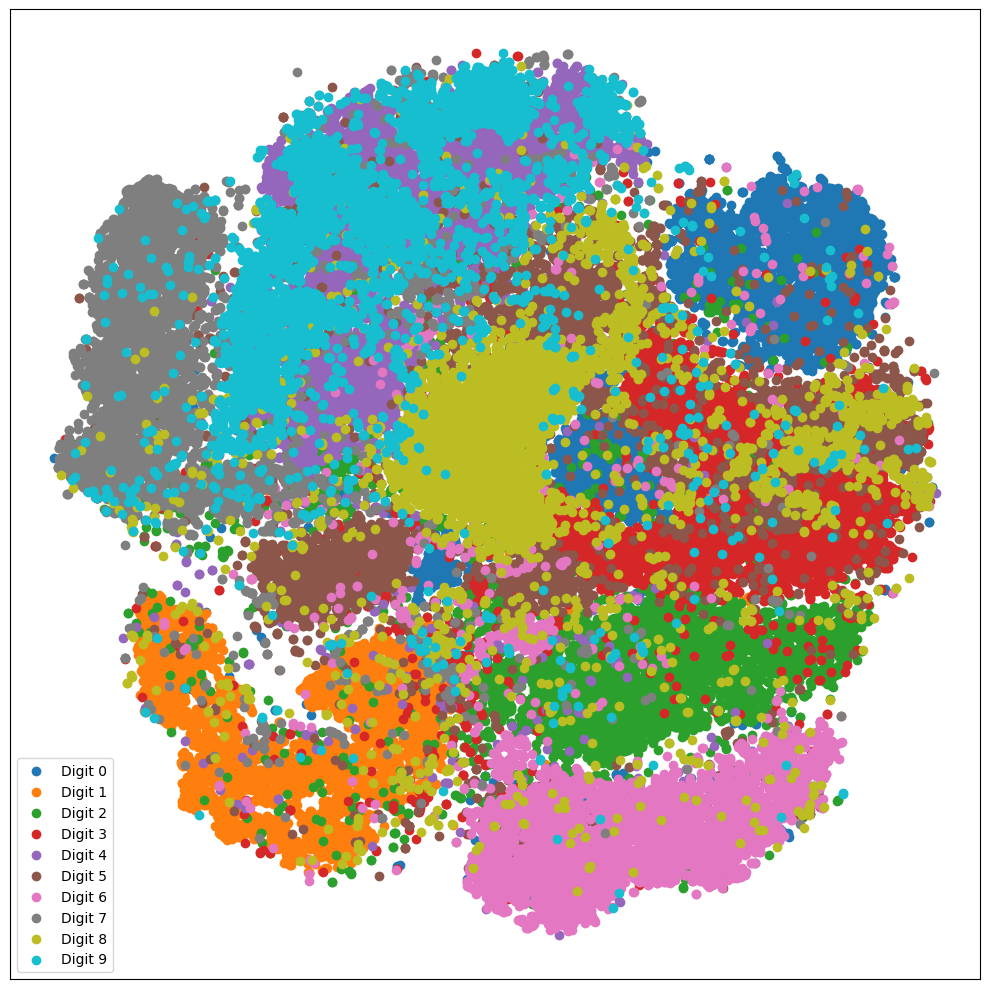

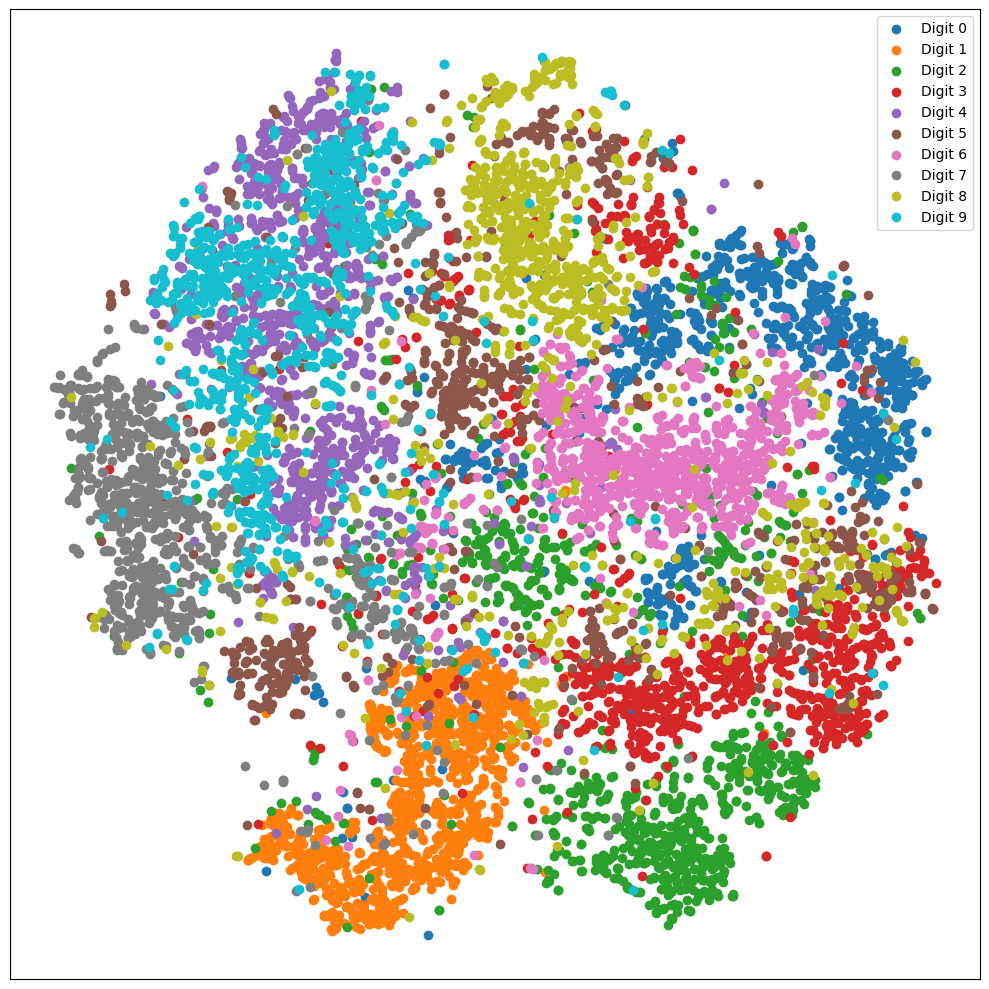

In [30]:
tsne_model = TSNE(n_components=2, perplexity=40)

train_layer1_tsne = tsne_model.fit_transform(train_layer1_output)
test_layer1_tsne = tsne_model.fit_transform(test_layer1_output)

plot_2d_mnist_scatter(train_layer1_tsne, y_train)
plot_2d_mnist_scatter(test_layer1_tsne, y_test)

train_layer2_tsne = tsne_model.fit_transform(train_layer2_output)
test_layer2_tsne = tsne_model.fit_transform(test_layer2_output)

plot_2d_mnist_scatter(train_layer2_tsne, y_train)
plot_2d_mnist_scatter(test_layer2_tsne, y_test)

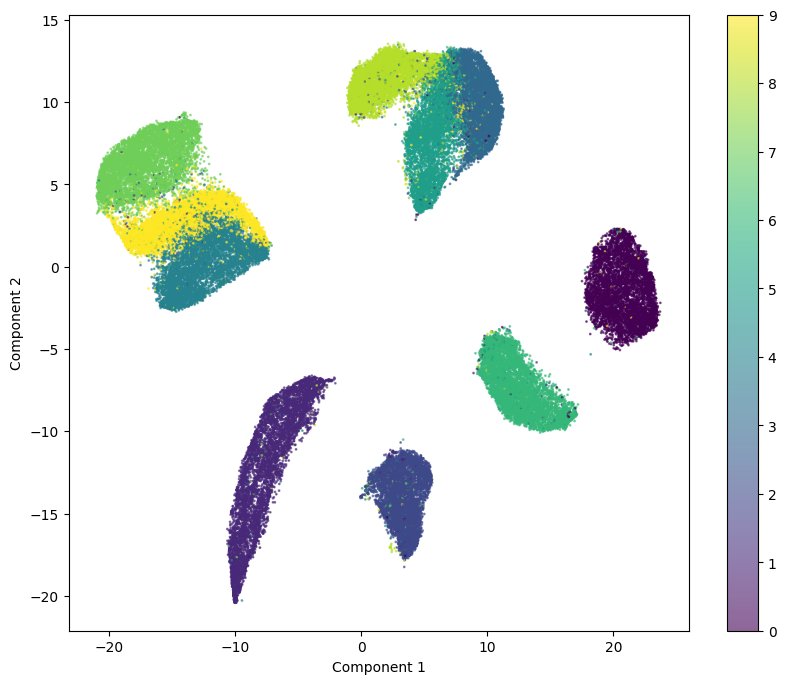

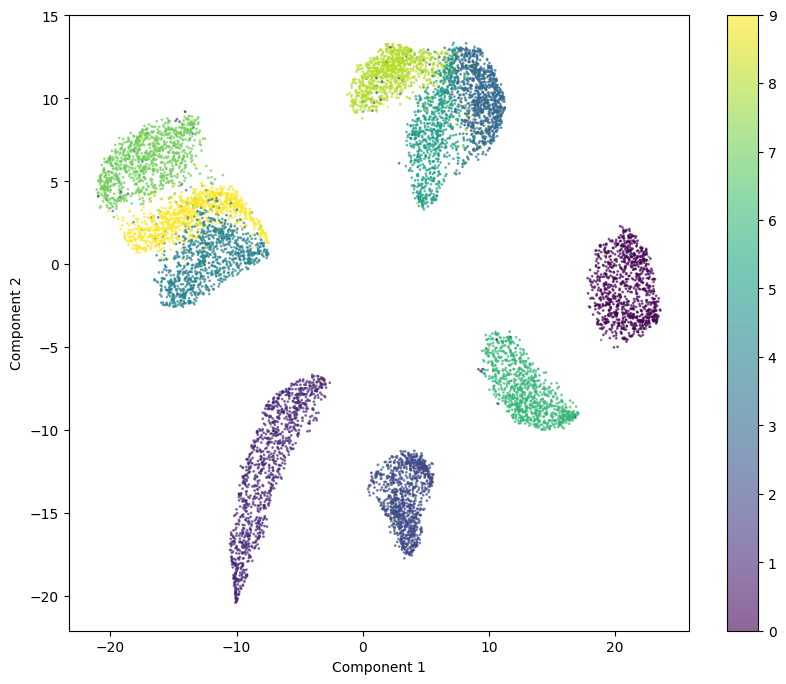

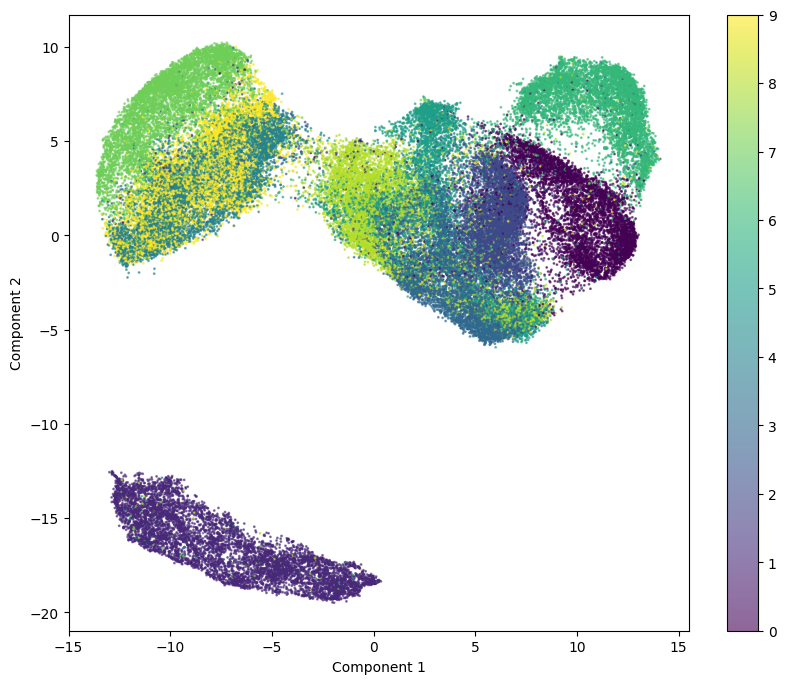

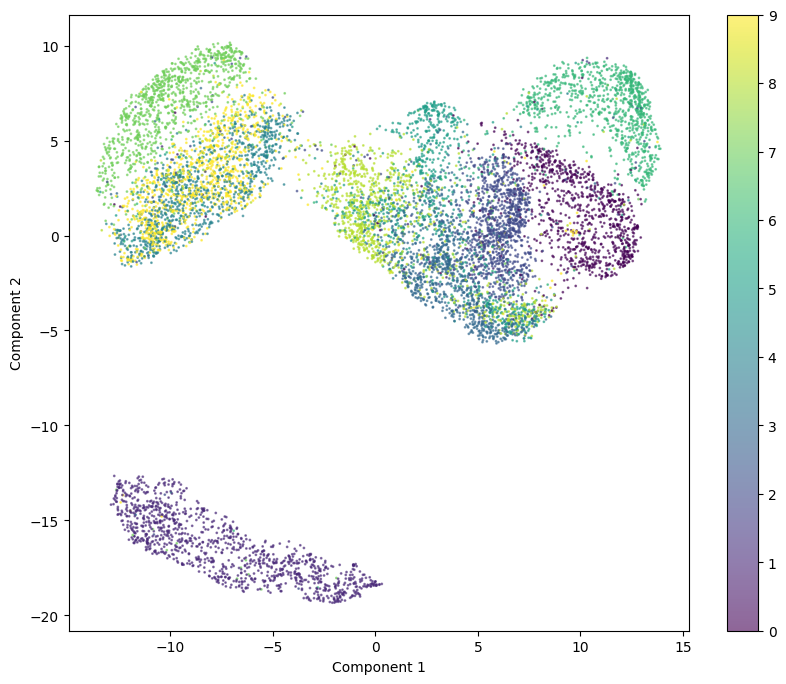

In [37]:
import numpy as np
import pacmap

def process_layer_with_pacmap(train_layer_output, test_layer_output, y_train, y_test, layer_name):
    combined_layer_output = np.vstack((train_layer_output, test_layer_output))

    pacmap_model = pacmap.PaCMAP(n_components=2, n_neighbors=10)
    combined_layer_pacmap = pacmap_model.fit_transform(combined_layer_output)

    num_train = train_layer_output.shape[0] 
    train_layer_pacmap = combined_layer_pacmap[:num_train]
    test_layer_pacmap = combined_layer_pacmap[num_train:]

    plot_2d_mnist_scatter(train_layer_pacmap, y_train)
    plot_2d_mnist_scatter(test_layer_pacmap, y_test)

process_layer_with_pacmap(train_layer1_output, test_layer1_output, y_train, y_test, 'Layer 1')
process_layer_with_pacmap(train_layer2_output, test_layer2_output, y_train, y_test, 'Layer 2')



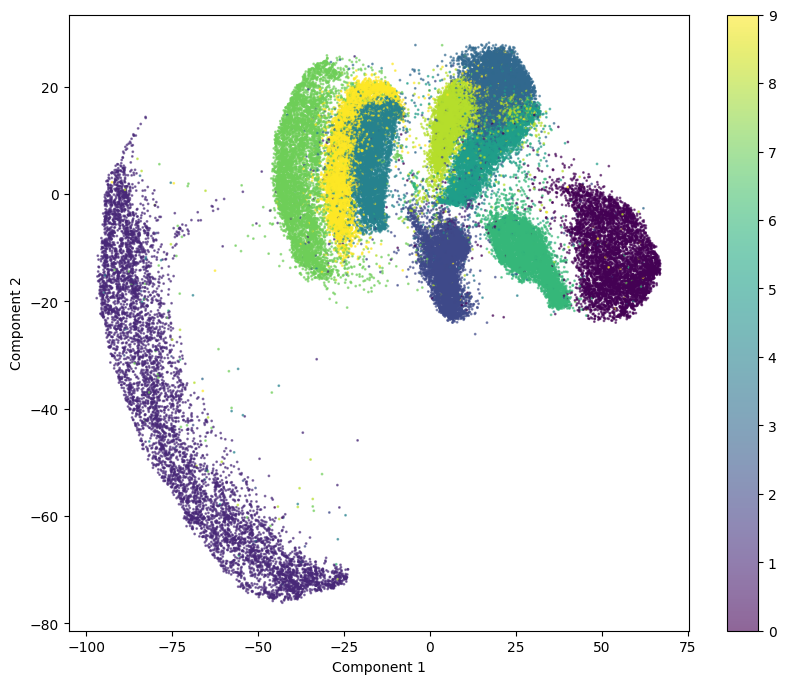

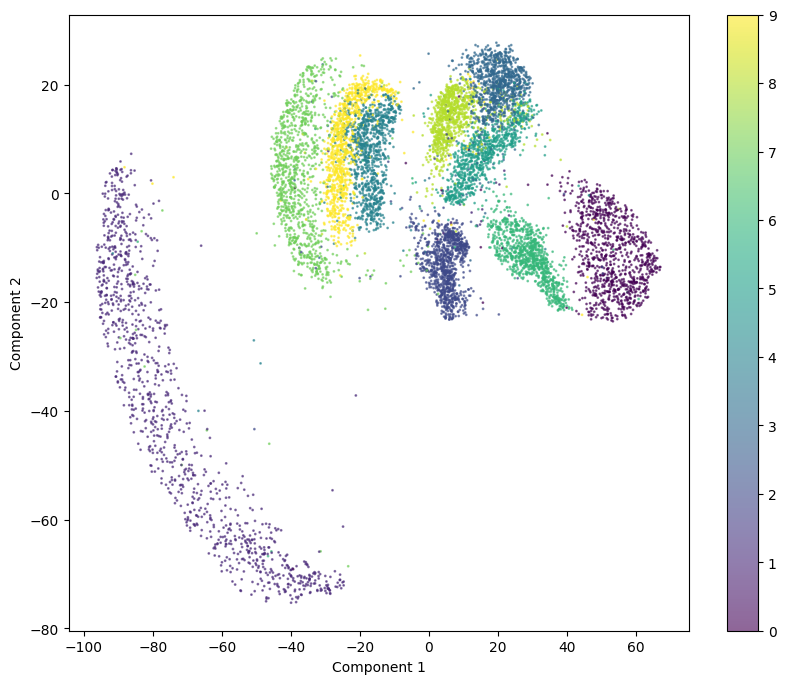

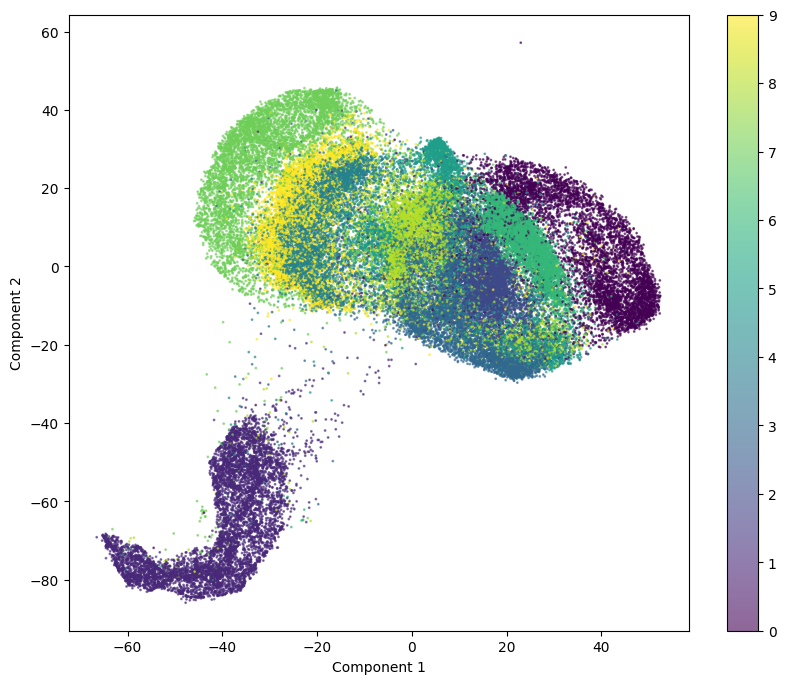

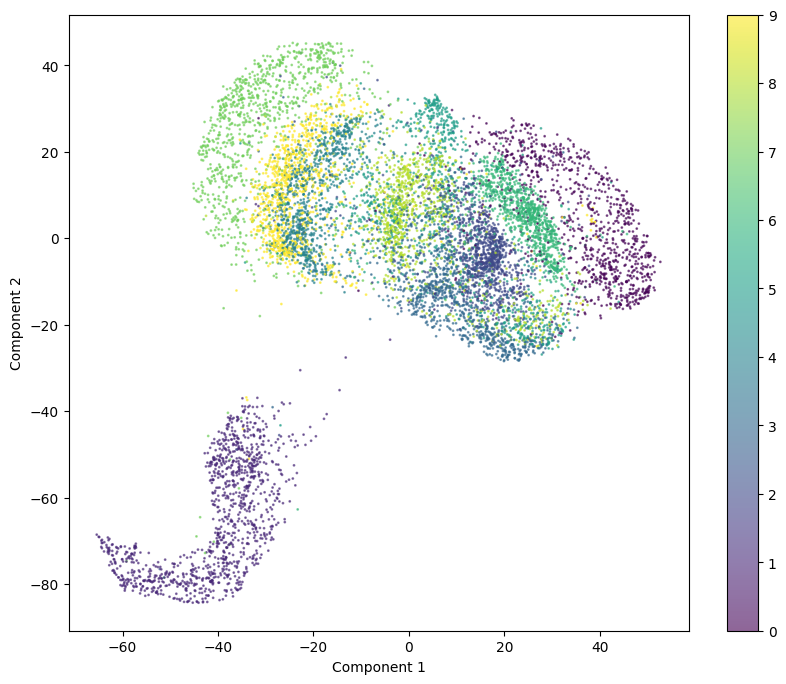

In [38]:
import numpy as np
import trimap

def process_layer_with_trimap(train_layer_output, test_layer_output, y_train, y_test, layer_name):
    combined_layer_output = np.vstack((train_layer_output, test_layer_output))

    trimap_model = trimap.TRIMAP()
    combined_layer_trimap = trimap_model.fit_transform(combined_layer_output)

    num_train = train_layer_output.shape[0]  
    train_layer_trimap = combined_layer_trimap[:num_train]
    test_layer_trimap = combined_layer_trimap[num_train:]

    plot_2d_mnist_scatter(train_layer_trimap, y_train)
    plot_2d_mnist_scatter(test_layer_trimap, y_test)

process_layer_with_trimap(train_layer1_output, test_layer1_output, y_train, y_test, 'Layer 1')
process_layer_with_trimap(train_layer2_output, test_layer2_output, y_train, y_test, 'Layer 2')


- Use the k-nearest neighbors algorithm to classify transformed points from the test set. Use the KNN algorithm in which you will use points from the training set as a neighbor with known class assignment. Because t-SNE is a non-linear, non-parametric embedding you cant use already learned t-SNE to transform new points into the existing embedded space. So for this part, use only UMAP with have fit_transform method (learn manifold) and also transform (only project new data to existing manifold). Try with few values of n_neighbors e.g [3, 5, 10]
- Estimate the accuracy of classification using this approach. Use all 3 layers (raw data, 1 hidden layer, 2 hidden layer) and few values of n_neighbors

C:\Users\Acer\AppData\Local\Programs\Python\Python312\Lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
C:\Users\Acer\AppData\Local\Programs\Python\Python312\Lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
C:\Users\Acer\AppData\Local\Programs\Python\Python312\Lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
C:\Users\Acer\AppData\Local\Programs\Python\Python312\Lib\site-packages\umap\umap_.py:1943: UserWarning

        Data  UMAP n_neighbors  KNN n_neighbors  Accuracy
0    Layer 1                 3                3    0.8161
1    Layer 1                 3                5    0.8197
2    Layer 1                 3               10    0.8202
3    Layer 1                 5                3    0.8689
4    Layer 1                 5                5    0.8744
5    Layer 1                 5               10    0.8764
6    Layer 1                10                3    0.9272
7    Layer 1                10                5    0.9318
8    Layer 1                10               10    0.9339
9    Layer 2                 3                3    0.6472
10   Layer 2                 3                5    0.6595
11   Layer 2                 3               10    0.6664
12   Layer 2                 5                3    0.7001
13   Layer 2                 5                5    0.7157
14   Layer 2                 5               10    0.7270
15   Layer 2                10                3    0.7494
16   Layer 2  

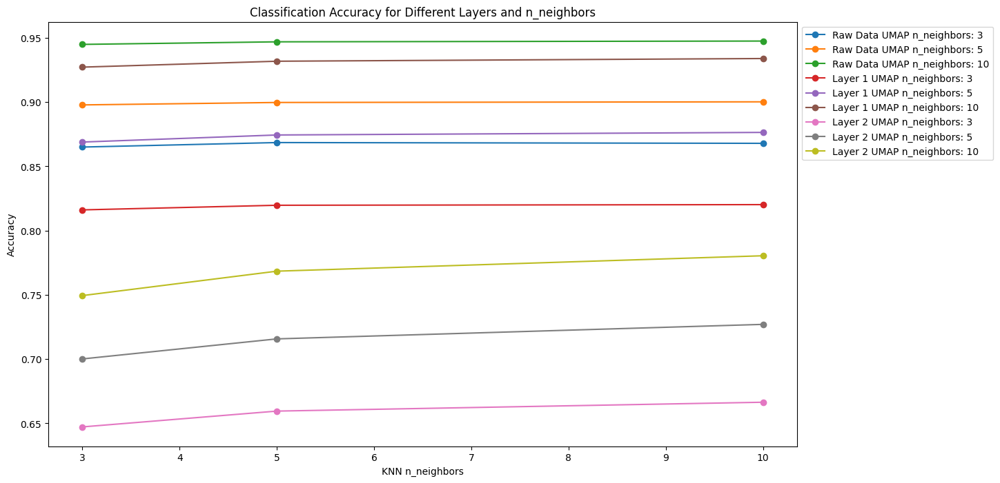

In [43]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
import umap
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

datasets = [
    (X_train, X_test, 'Raw Data'),
    (train_layer1_output, test_layer1_output, 'Layer 1'),
    (train_layer2_output, test_layer2_output, 'Layer 2')
]

n_neighbors_umap = [3, 5, 10]
n_neighbors_knn = [3, 5, 10]

results = []

for data_train, data_test, label in datasets:
    for n_neighbors_u in n_neighbors_umap:
        umap_model = umap.UMAP(n_neighbors=n_neighbors_u, n_components=2, random_state=42)
        X_train_umap = umap_model.fit_transform(data_train)
        X_test_umap = umap_model.transform(data_test)
        
        for n_neighbors_k in n_neighbors_knn:
            knn = KNeighborsClassifier(n_neighbors=n_neighbors_k)
            knn.fit(X_train_umap, y_train)
            y_pred = knn.predict(X_test_umap)
            accuracy = accuracy_score(y_test, y_pred)
            
            results.append((label, n_neighbors_u, n_neighbors_k, accuracy))

fig, ax = plt.subplots(figsize=(14, 8))

for label in set(x[0] for x in results):
    layer_results = [(n_u, n_k, acc) for l, n_u, n_k, acc in results if l == label]
    for n_neighbors_u in n_neighbors_umap:
        accuracies = [acc for n_u, n_k, acc in layer_results if n_u == n_neighbors_u]
        ax.plot(n_neighbors_knn, accuracies, '-o', label=f"{label} UMAP n_neighbors: {n_neighbors_u}")

df_results = pd.DataFrame(results, columns=['Data', 'UMAP n_neighbors', 'KNN n_neighbors', 'Accuracy'])
df_results.sort_values(by=['Data', 'UMAP n_neighbors', 'KNN n_neighbors'], inplace=True)
df_results.reset_index(drop=True, inplace=True)
print(df_results)

ax.set_xlabel('KNN n_neighbors')
ax.set_ylabel('Accuracy')
ax.set_title('Classification Accuracy for Different Layers and n_neighbors')
ax.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()


# Task 2

Repeate the above training procedures and visualizations for FMNIST (or any other dataset of your choice)

In [3]:
from keras.datasets import fashion_mnist as fmnist
import numpy as np

(X_train, y_train), (X_test, y_test) = fmnist.load_data()

X_train_flat = X_train.reshape(-1, 784) / 255.0
X_test_flat = X_test.reshape(-1, 784) / 255.0


In [4]:
from pacmap import PaCMAP

pacmap_instance = PaCMAP(n_components=2)
X_train_pacmap = pacmap_instance.fit_transform(X_train_flat[:5000])

In [5]:
import trimap

X_train_trimap = trimap.TRIMAP().fit_transform(X_train_flat[:5000])

In [6]:
import umap

umap_instance = umap.UMAP(n_components=2, n_neighbors=15, min_dist=0.1, metric='euclidean')
X_train_umap = umap_instance.fit_transform(X_train_flat[:5000])

In [7]:
from sklearn.manifold import TSNE

tsne_instance = TSNE(n_components=2, perplexity=30)
X_train_tsne = tsne_instance.fit_transform(X_train_flat[:5000])

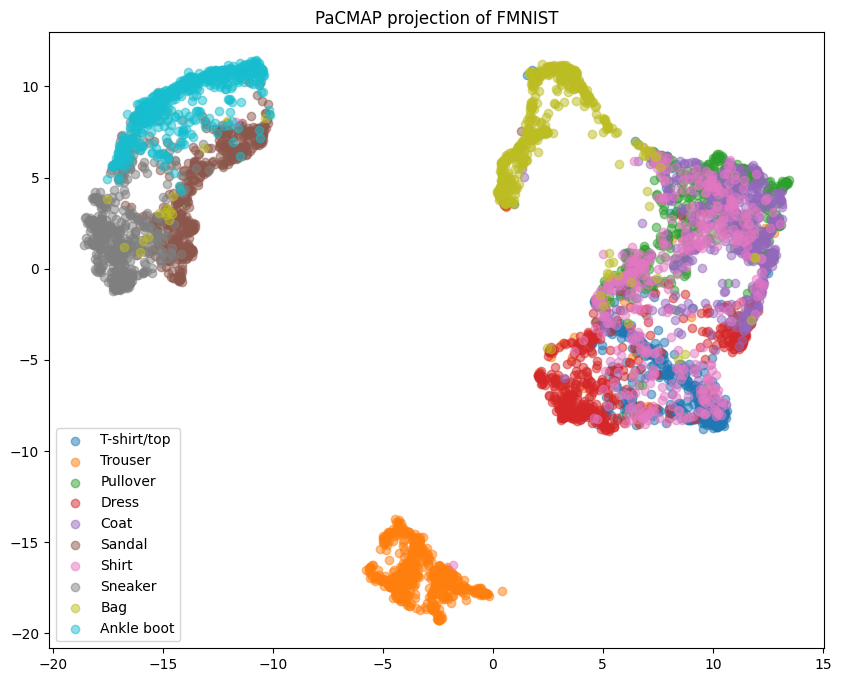

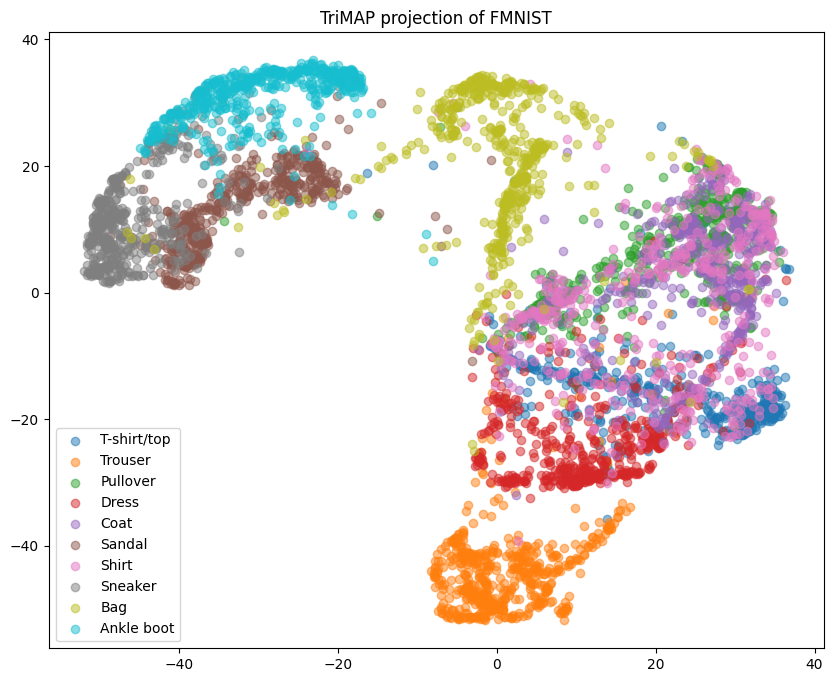

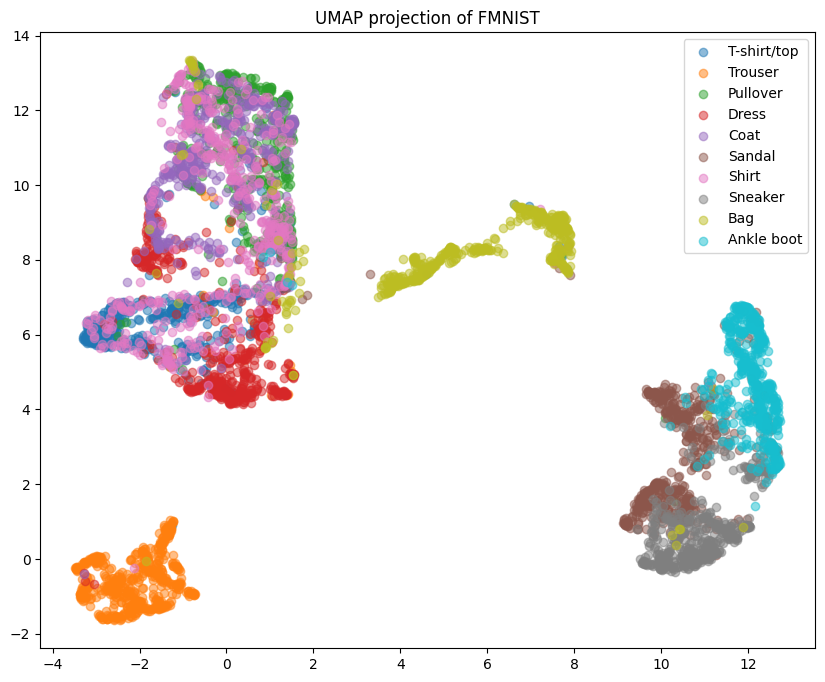

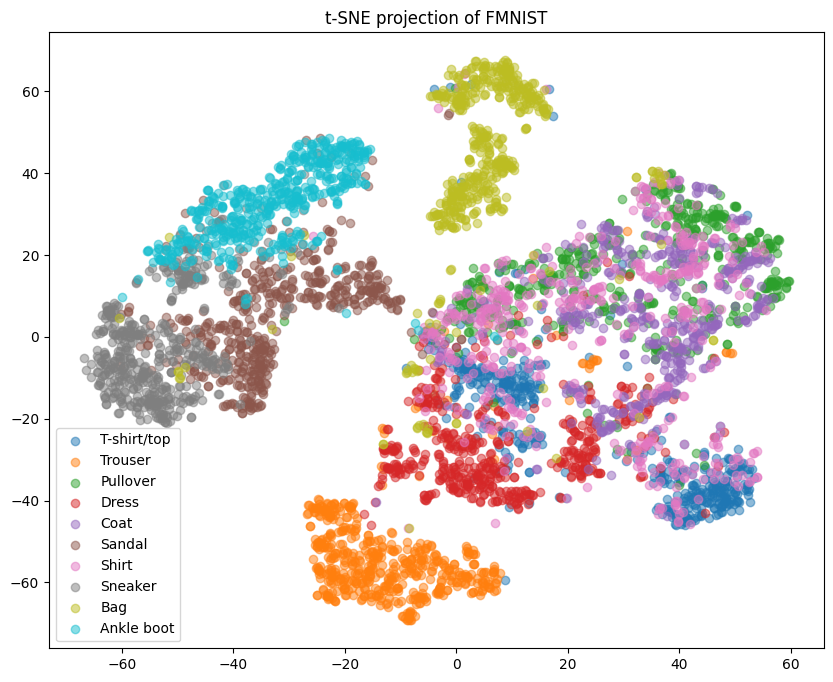

In [8]:
def plot_embedding(X, y, title='2D projection', labels=None):
    plt.figure(figsize=(10, 8))
    for i in range(10):
        indices = np.where(y == i)
        plt.scatter(X[indices, 0], X[indices, 1], label=labels[i] if labels else i, alpha=0.5)
    plt.legend(loc='best')
    plt.title(title)
    plt.show()
    
labels = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 
          'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']

plot_embedding(X_train_pacmap, y_train[:5000], title='PaCMAP projection of FMNIST', labels=labels)

plot_embedding(X_train_trimap, y_train[:5000], title='TriMAP projection of FMNIST', labels=labels)

plot_embedding(X_train_umap, y_train[:5000], title='UMAP projection of FMNIST', labels=labels)

plot_embedding(X_train_tsne, y_train[:5000], title='t-SNE projection of FMNIST', labels=labels)

In [4]:
from keras.models import Model
from keras.layers import Input, Dense, Flatten
from keras.utils import to_categorical

y_train_categorical = to_categorical(y_train)
y_test_categorical = to_categorical(y_test)

input_layer = Input(shape=(784,))
x = Dense(128, activation='relu')(input_layer)
layer1_output = Dense(64, activation='relu')(x)
predictions = Dense(10, activation='softmax')(layer1_output)

model = Model(inputs=input_layer, outputs=predictions)
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

model.fit(X_train_flat, y_train_categorical, epochs=5, batch_size=32, validation_split=0.2)

Epoch 1/5
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 15s 8ms/step - accuracy: 0.7673 - loss: 0.6669 - val_accuracy: 0.8472 - val_loss: 0.4281
Epoch 2/5
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 11s 7ms/step - accuracy: 0.8595 - loss: 0.3894 - val_accuracy: 0.8639 - val_loss: 0.3711
Epoch 3/5
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 18s 5ms/step - accuracy: 0.8722 - loss: 0.3473 - val_accuracy: 0.8638 - val_loss: 0.3726
Epoch 4/5
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8819 - loss: 0.3156 - val_accuracy: 0.8752 - val_loss: 0.3421
Epoch 5/5
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 10s 5ms/step - accuracy: 0.8875 - loss: 0.2957 - val_accuracy: 0.8816 - val_loss: 0.3278


In [5]:
layer1_model = Model(inputs=model.input, outputs=model.layers[1].output)
layer2_model = Model(inputs=model.input, outputs=model.layers[2].output)

layer1_output_train = layer1_model.predict(X_train_flat)
layer1_output_test = layer1_model.predict(X_test_flat)

layer2_output_train = layer2_model.predict(X_train_flat)
layer2_output_test = layer2_model.predict(X_test_flat)

1875/1875 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


In [25]:
combined_layer1 = np.concatenate([layer1_output_train[:5000], layer1_output_test[:5000]])
combined_layer2 = np.concatenate([layer2_output_train[:5000], layer2_output_test[:5000]])

pacmap_instance_combined_layer1 = PaCMAP(n_components=2)
X_combined_layer1_pacmap = pacmap_instance_combined_layer1.fit_transform(combined_layer1)

pacmap_instance_combined_layer2 = PaCMAP(n_components=2)
X_combined_layer2_pacmap = pacmap_instance_combined_layer2.fit_transform(combined_layer2)

X_layer1_train_pacmap = X_combined_layer1_pacmap[:5000]
X_layer1_test_pacmap = X_combined_layer1_pacmap[5000:]

X_layer2_train_pacmap = X_combined_layer2_pacmap[:5000]
X_layer2_test_pacmap = X_combined_layer2_pacmap[5000:]

In [24]:
trimap_instance_layer1_train = trimap.TRIMAP()
X_layer1_train_trimap = trimap_instance_layer1_train.fit_transform(layer1_output_train[:5000])

trimap_instance_layer1_test = trimap.TRIMAP()
X_layer1_test_trimap = trimap_instance_layer1_test.fit_transform(layer1_output_test[:5000])

trimap_instance_layer2_train = trimap.TRIMAP()
X_layer2_train_trimap = trimap_instance_layer2_train.fit_transform(layer2_output_train[:5000])

trimap_instance_layer2_test = trimap.TRIMAP()
X_layer2_test_trimap = trimap_instance_layer2_test.fit_transform(layer2_output_test[:5000])


In [11]:
umap_instance_layer1 = umap.UMAP(n_components=2, n_neighbors=15, min_dist=0.1, metric='euclidean')
X_layer1_train_umap = umap_instance_layer1.fit_transform(layer1_output_train[:5000])
X_layer1_test_umap = umap_instance_layer1.transform(layer1_output_test[:5000])

umap_instance_layer2 = umap.UMAP(n_components=2, n_neighbors=15, min_dist=0.1, metric='euclidean')
X_layer2_train_umap = umap_instance_layer2.fit_transform(layer2_output_train[:5000])
X_layer2_test_umap = umap_instance_layer2.transform(layer2_output_test[:5000])

In [23]:
tsne_instance_layer1 = TSNE(n_components=2, perplexity=30)
X_layer1_train_tsne = tsne_instance_layer1.fit_transform(layer1_output_train[:5000])
X_layer1_test_tsne = tsne_instance_layer1.fit_transform(layer1_output_test[:5000])

tsne_instance_layer2 = TSNE(n_components=2, perplexity=30)
X_layer2_train_tsne = tsne_instance_layer2.fit_transform(layer2_output_train[:5000])
X_layer2_test_tsne = tsne_instance_layer2.fit_transform(layer2_output_test[:5000])

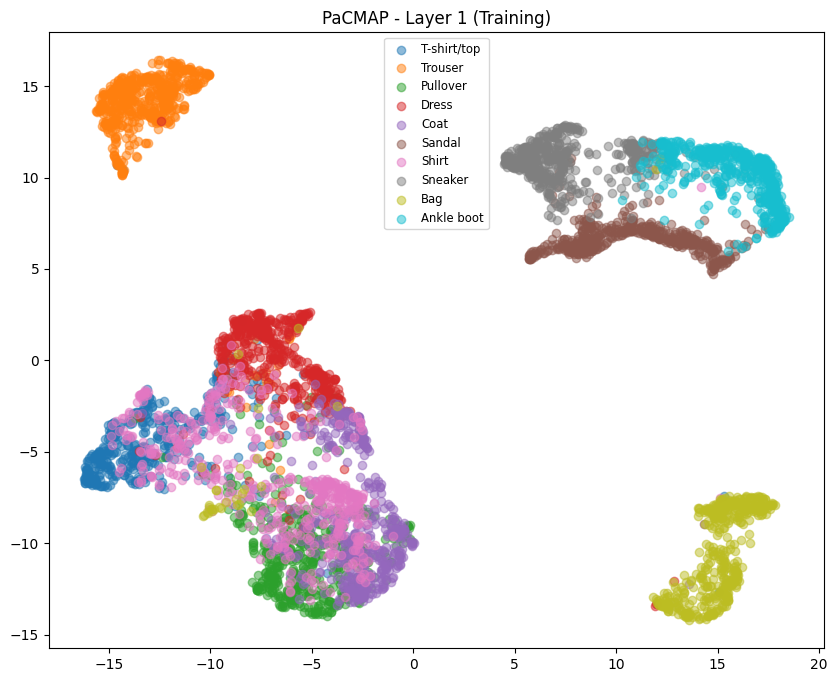

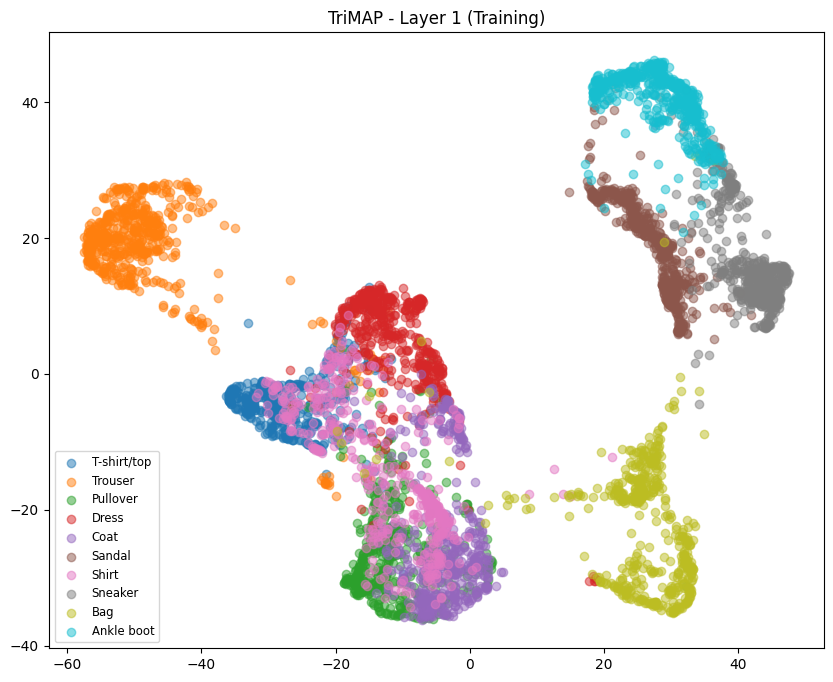

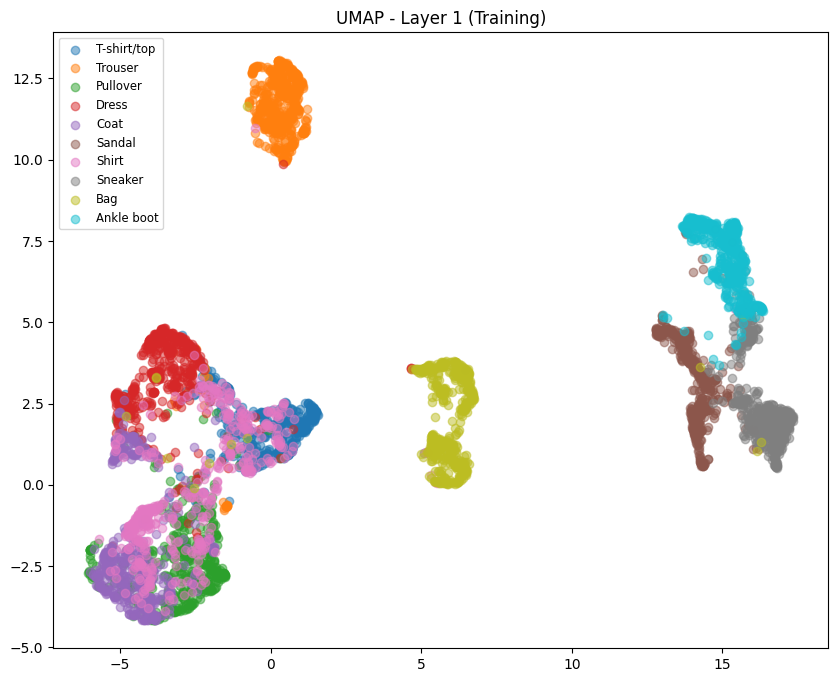

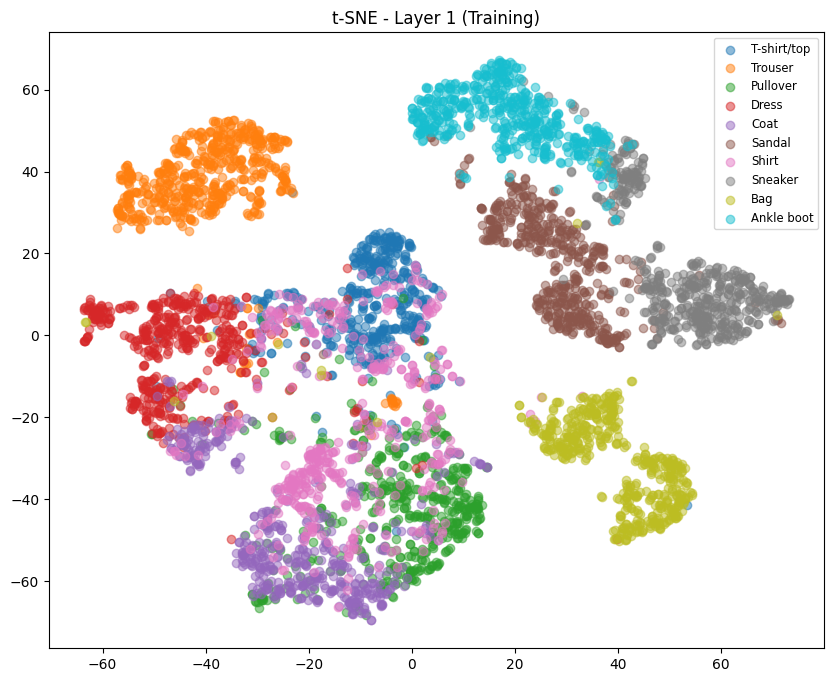

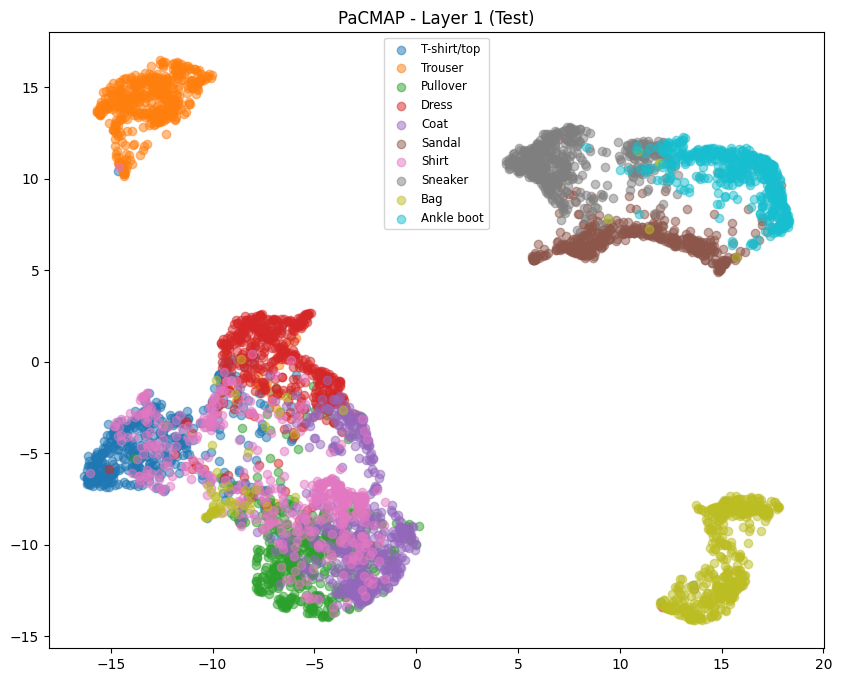

...

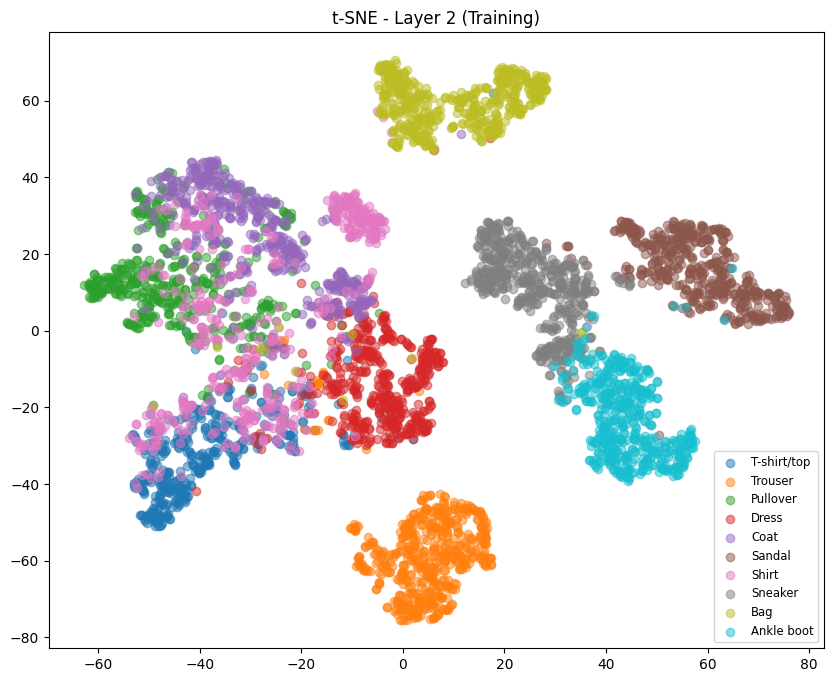

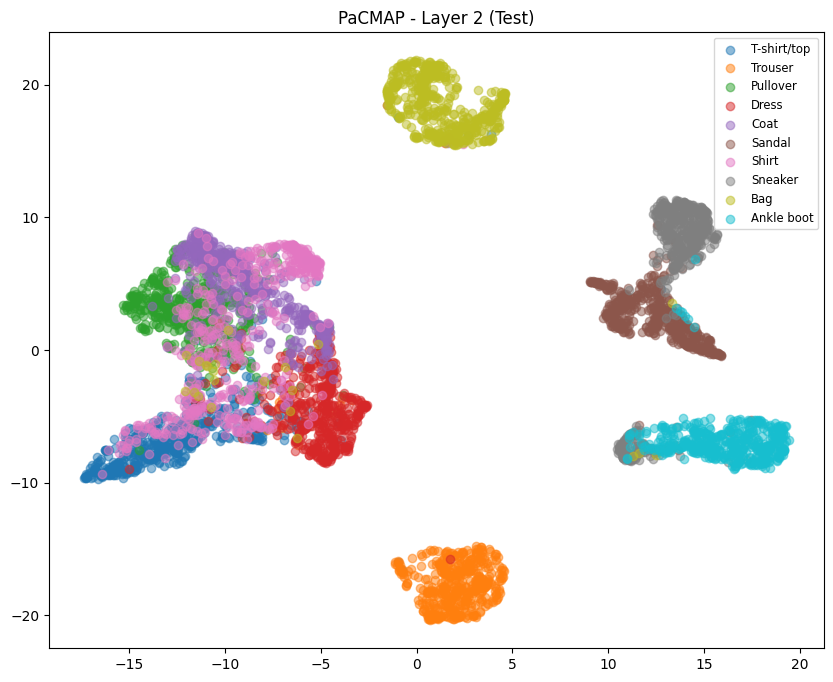

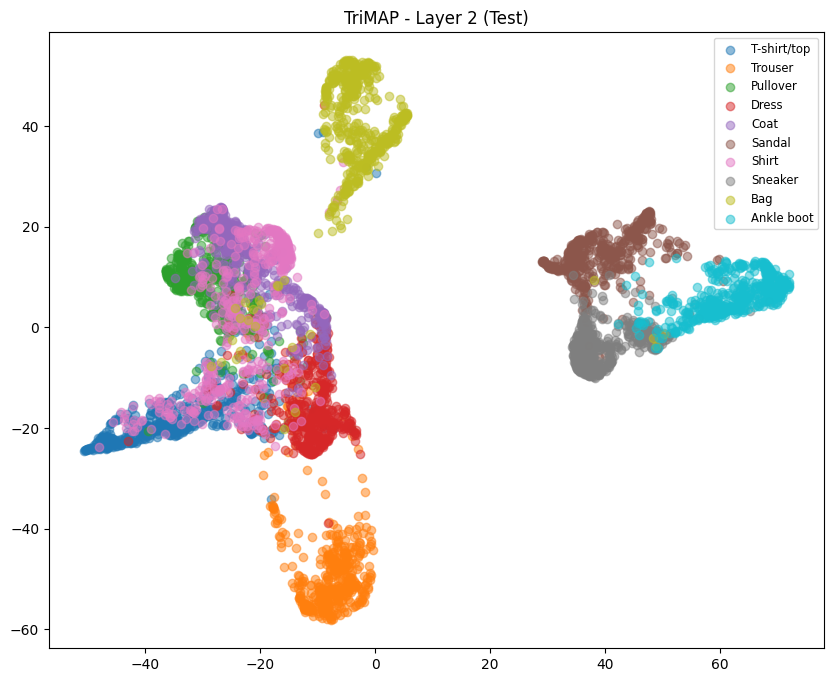

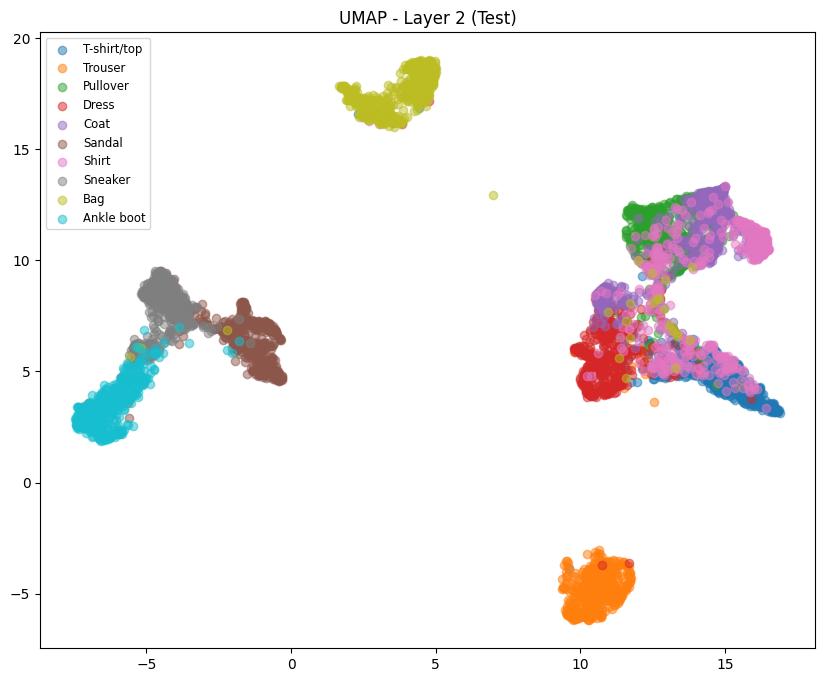

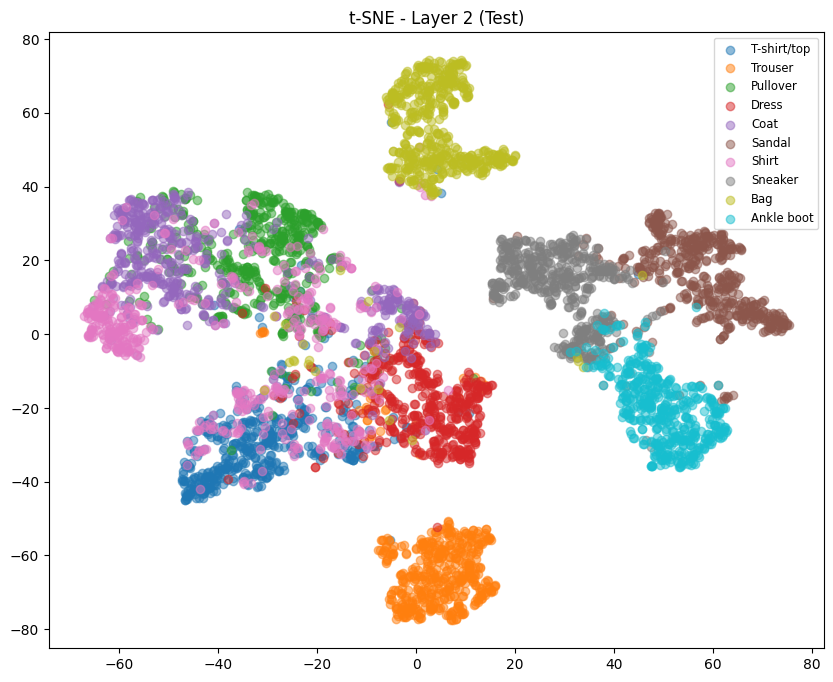

In [26]:
import matplotlib.pyplot as plt

def plot_embedding(X, y, title='2D projection', labels=None):
    plt.figure(figsize=(10, 8))
    for i in range(10):
        indices = np.where(y[:len(X)] == i)
        plt.scatter(X[indices, 0], X[indices, 1], label=labels[i] if labels else i, alpha=0.5)
    plt.legend(loc='best', fontsize='small')
    plt.title(title)
    plt.show()

labels = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 
          'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']


plot_embedding(X_layer1_train_pacmap, y_train[:5000], 'PaCMAP - Layer 1 (Training)', labels)
plot_embedding(X_layer1_train_trimap, y_train[:5000], 'TriMAP - Layer 1 (Training)', labels)
plot_embedding(X_layer1_train_umap, y_train[:5000], 'UMAP - Layer 1 (Training)', labels)
plot_embedding(X_layer1_train_tsne, y_train[:5000], 't-SNE - Layer 1 (Training)', labels)

plot_embedding(X_layer1_test_pacmap, y_test[:5000], 'PaCMAP - Layer 1 (Test)', labels)
plot_embedding(X_layer1_test_trimap, y_test[:5000], 'TriMAP - Layer 1 (Test)', labels)
plot_embedding(X_layer1_test_umap, y_test[:5000], 'UMAP - Layer 1 (Test)', labels)
plot_embedding(X_layer1_test_tsne, y_test[:5000], 't-SNE - Layer 1 (Test)', labels)

plot_embedding(X_layer2_train_pacmap, y_train[:5000], 'PaCMAP - Layer 2 (Training)', labels)
plot_embedding(X_layer2_train_trimap, y_train[:5000], 'TriMAP - Layer 2 (Training)', labels)
plot_embedding(X_layer2_train_umap, y_train[:5000], 'UMAP - Layer 2 (Training)', labels)
plot_embedding(X_layer2_train_tsne, y_train[:5000], 't-SNE - Layer 2 (Training)', labels)


plot_embedding(X_layer2_test_pacmap, y_test[:5000], 'PaCMAP - Layer 2 (Test)', labels)
plot_embedding(X_layer2_test_trimap, y_test[:5000], 'TriMAP - Layer 2 (Test)', labels)
plot_embedding(X_layer2_test_umap, y_test[:5000], 'UMAP - Layer 2 (Test)', labels)
plot_embedding(X_layer2_test_tsne, y_test[:5000], 't-SNE - Layer 2 (Test)', labels)

In [6]:
import trimap

trimap_reducer_raw = trimap.TRIMAP()
X_train_raw_trimap = trimap_reducer_raw.fit_transform(X_train_flat[:5000])
X_test_raw_trimap = trimap_reducer_raw.fit_transform(X_test_flat[:5000])

In [7]:
from pacmap import PaCMAP

pacmap_reducer_raw = PaCMAP(n_components=2)
X_train_raw_pacmap = pacmap_reducer_raw.fit_transform(X_train_flat[:5000])
X_test_raw_pacmap = pacmap_reducer_raw.fit_transform(X_test_flat[:5000])

In [8]:
import umap

umap_reducer_raw = umap.UMAP(n_components=2, random_state=42)
umap_reducer_raw.fit(X_train_flat[:5000])
X_train_raw_umap = umap_reducer_raw.transform(X_train_flat[:5000])
X_test_raw_umap = umap_reducer_raw.transform(X_test_flat[:5000])

C:\Users\Acer\AppData\Local\Programs\Python\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
C:\Users\Acer\AppData\Local\Programs\Python\Python312\Lib\site-packages\umap\umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


In [9]:
from sklearn.manifold import TSNE

tsne_reducer_raw = TSNE(n_components=2, perplexity=30, random_state=42)
X_train_raw_tsne = tsne_reducer_raw.fit_transform(X_train_flat[:5000])
X_test_raw_tsne = tsne_reducer_raw.fit_transform(X_test_flat[:5000])

In [14]:
import umap
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

results = []

umap_datasets = {
    'Raw Data': (X_train_raw_umap, X_test_raw_umap),
    'Layer 1': (X_layer1_train_umap, X_layer1_test_umap),
    'Layer 2': (X_layer2_train_umap, X_layer2_test_umap),
}

n_neighbors_options = [3, 5, 10]
y_train_subset = y_train[:5000]
y_test_subset = y_test[:5000]

for layer_name, (X_train_umap, X_test_umap) in umap_datasets.items():
    for n_neighbors in n_neighbors_options:
        knn = KNeighborsClassifier(n_neighbors=n_neighbors)
        knn.fit(X_train_umap, y_train_subset) 
        y_pred = knn.predict(X_test_umap)
        accuracy = accuracy_score(y_test_subset, y_pred)
        results.append({
            'Layer': layer_name,
            'N Neighbors': n_neighbors,
            'Accuracy': accuracy
        })



In [15]:
import pandas as pd

results_df = pd.DataFrame(results)
print(results_df)

      Layer  N Neighbors  Accuracy
0  Raw Data            3    0.7140
1  Raw Data            5    0.7264
2  Raw Data           10    0.7398
3   Layer 1            3    0.8138
4   Layer 1            5    0.8252
5   Layer 1           10    0.8290
6   Layer 2            3    0.8424
7   Layer 2            5    0.8500
8   Layer 2           10    0.8526


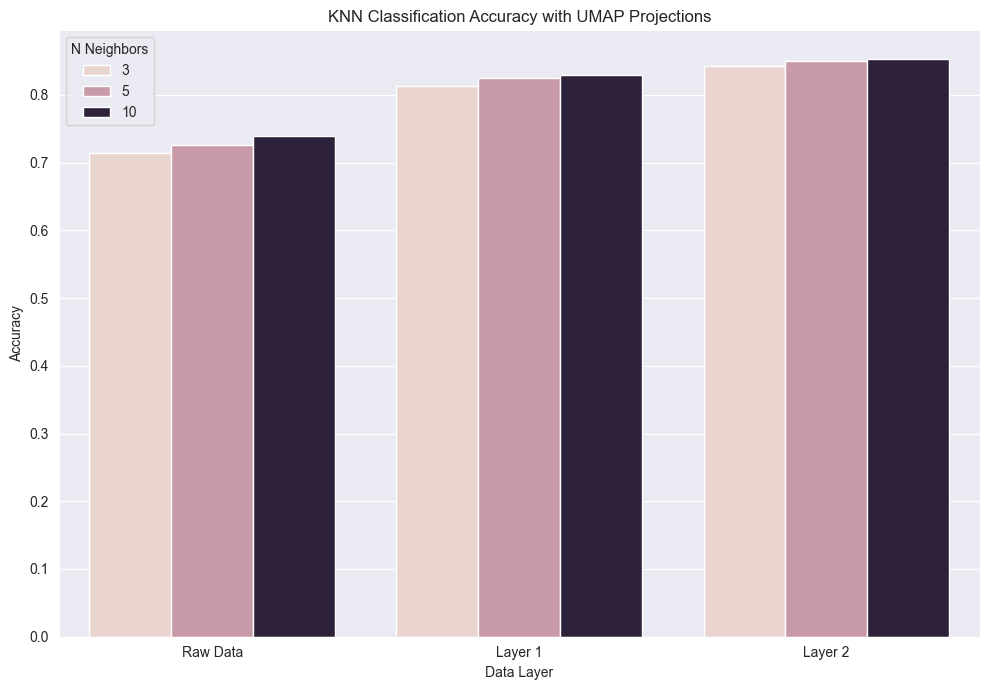

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 7))
sns.barplot(data=results_df, x='Layer', y='Accuracy', hue='N Neighbors')
plt.title('KNN Classification Accuracy with UMAP Projections')
plt.ylabel('Accuracy')
plt.xlabel('Data Layer')
plt.legend(title='N Neighbors')
plt.tight_layout()
plt.show()